In [ ]:
%matplotlib inline

In [ ]:
pip install plotly==5.22.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 24.4 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.24.1
    Uninstalling plotly-5.24.1:
      Successfully uninstalled plotly-5.24.1


In [ ]:
pip install nbformat>=4.2.0

**Reference:**

**Paper:** Maria Schuld et al paper "The effect of data encoding on the expressive power of variational quantum machine learning models"  https://arxiv.org/abs/2008.08605

**Tutorial:**

 https://github.com/XanaduAI/expressive_power_of_quantum_models/blob/master/tutorial_expressivity_fourier_series.ipynb .  https://pennylane.ai/qml/demos/tutorial_expressivity_fourier_series/  (Certain portions of code in these are outdated.)

**Blog Post:** "Circuits as fourier series" https://pennylane.ai/qml/demos/circuits_as_fourier_series/

# Introduction:

Above work shows that a certain quantum machine learning architecture known as the "Re-uploading type" model can be expressed as a truncated fourier sum. Truncated in the sense that the number of layers of trainable block repetitions dictate how much of the fourier frequncy space this model can cover. For more details about re-uploading models, refer to the blogpost: "Data-reuploading classifier" https://pennylane.ai/qml/demos/tutorial_data_reuploading_classifier/.



**TL;DR version for our practical purposes**:

The image below is the quantum circuit designed for the re-uploading type model alluded to in the work. What we mean by the "re-uploading" is that we repeat these W() and S(x) blocks throughout the quantum circuit (we read the quantum circuit similar to regular digital circuits i.e left to right, think of the left |0>'s as the input and the right most measuremeats as the outputs, in between there are gates. W()'s and S(x) are the gates. These have internal structures that we dont show here).

Now the paper shows that with enough repetitions of these W() and S(x) blocks we can learn a signal with adequete accuracy. We explore this in this notebook.

# Pennylane:

Pennylane is a quantum computing framework from xanadu that will give us access to the required quantum libraries for this simulation. Pennylane is essentially the alternativve to the IBM's Qiskit.

In [ ]:
pip install pennylane

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 31.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 930.0/930.0 kB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 25.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.9/167.9 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 38.6 MB/s eta 0:00:00


# Requisite libraries:

In [ ]:
import matplotlib.pyplot as plt

import pennylane as qml
from pennylane import numpy as np
from pennylane.templates import StronglyEntanglingLayers

from scipy.signal.windows import tukey # for windowing

from scipy.signal import find_peaks # for fft

np.random.seed(42)

A quick rundown of the code's functionalities:-
1. The window size can be set precisely using x values instead of data indices. This would enable us to keep the window constant even if we change scalling, sampling rate, etc.
2. The sampling rate over x is used to set the number of data points within the whole signal before windowing. Earlier code used the exact number of data points.
3. Now, a lot more parameters can be tweaked to study the effect of windowing.
3. Here there are two segments. The first code uses x values to set the left end as well as the right end of the window. The second code (which placed in the appendix as a single code cell for ease) uses x values only to set the left/starting point of the window, and then the number of data points we need is manually set to get the width of the window. The second method would be more useful to make the number of data points within the window arbitrarily small.

# 3 qubit 1 layer

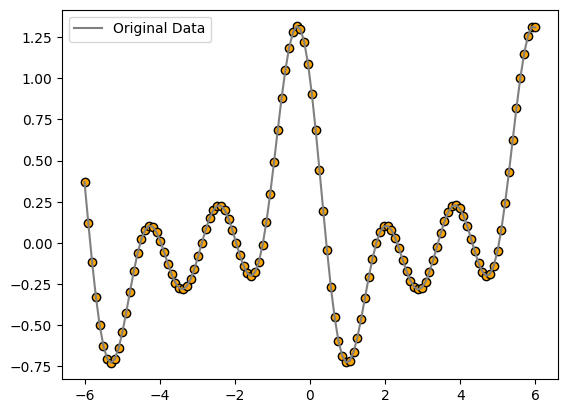

Window End: -4.50, Window Size: 5, R²: 0.990216


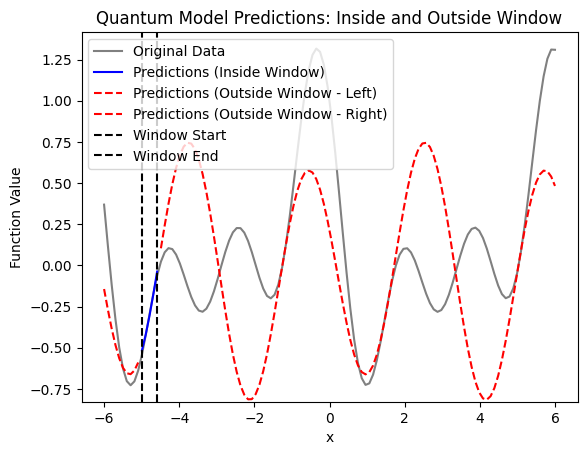

Window End: -4.30, Window Size: 7, R²: 0.990594


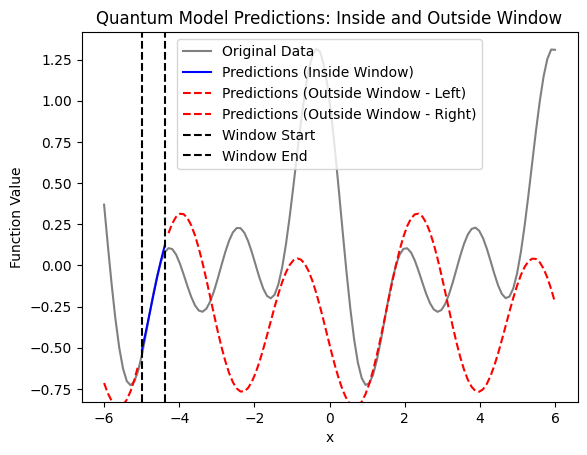

Window End: -4.10, Window Size: 9, R²: 0.985994


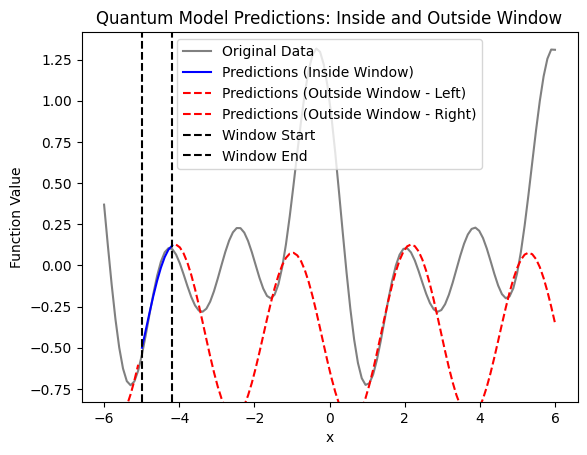

Window End: -3.90, Window Size: 11, R²: 0.978711


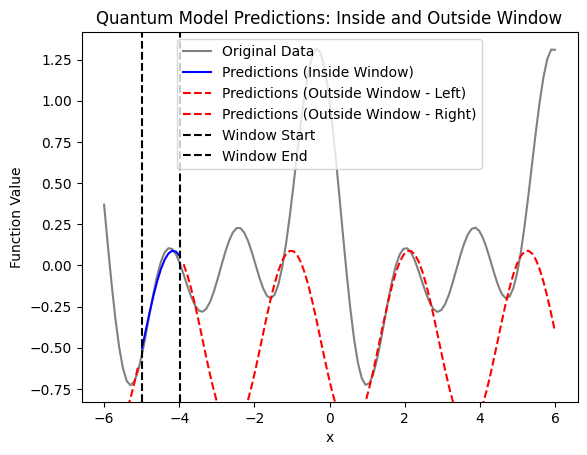

Window End: -3.70, Window Size: 13, R²: 0.917929


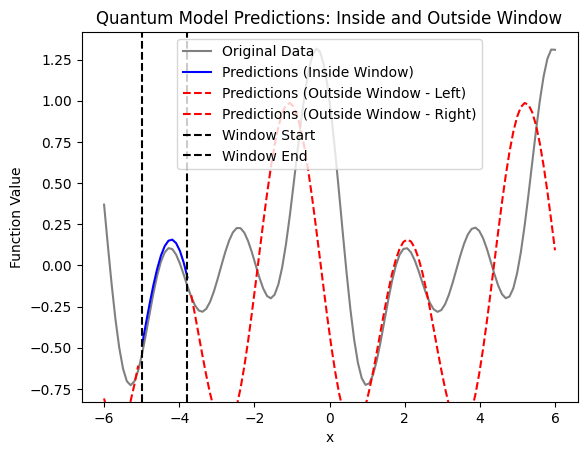

Window End: -3.50, Window Size: 15, R²: 0.961960


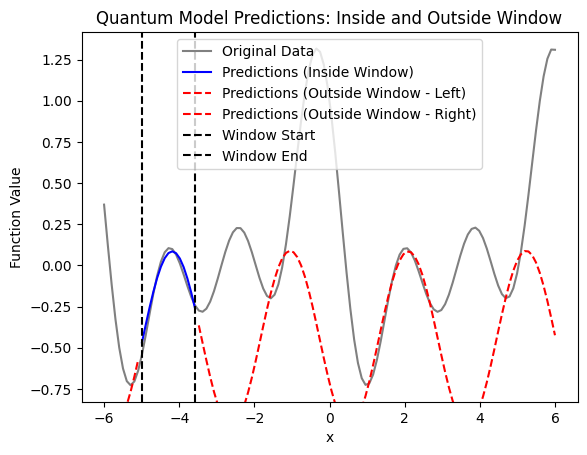

Window End: -3.30, Window Size: 17, R²: 0.914291


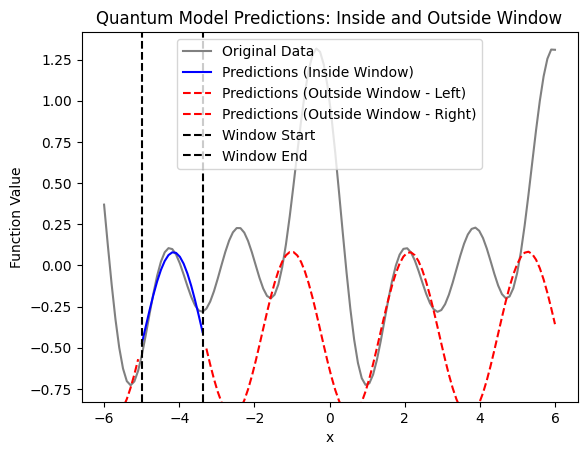

Window End: -3.10, Window Size: 19, R²: 0.838980


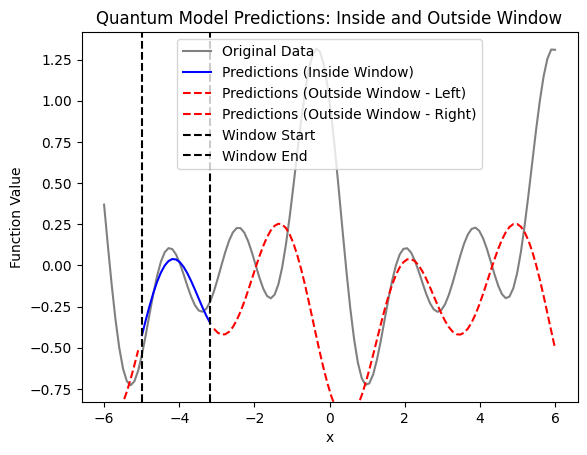

Window End: -2.90, Window Size: 21, R²: 0.720636


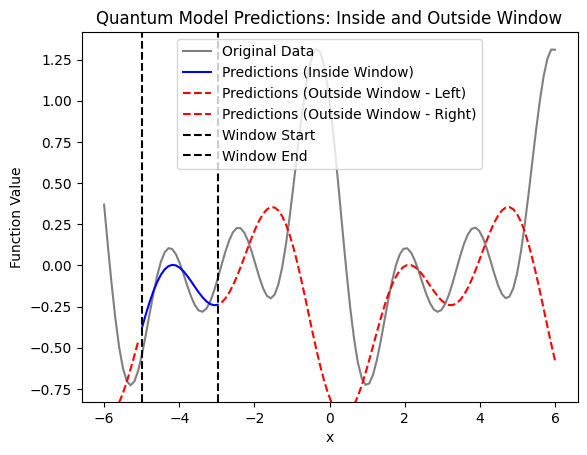

Window End: -2.70, Window Size: 23, R²: 0.758140


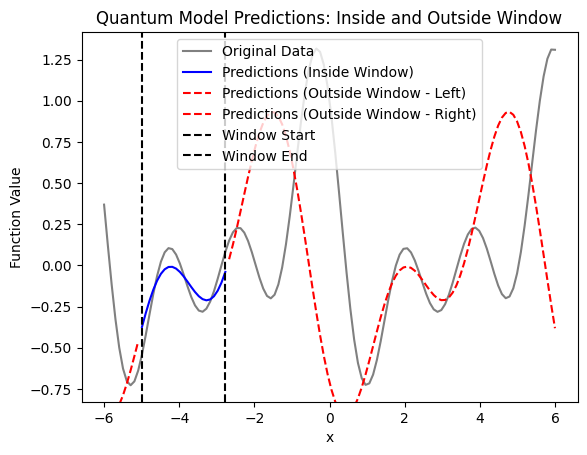

Window End: -2.50, Window Size: 25, R²: 0.723407


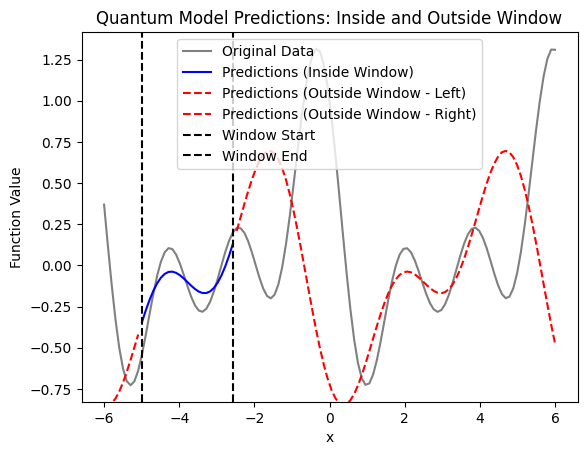

Window End: -2.30, Window Size: 27, R²: 0.794335


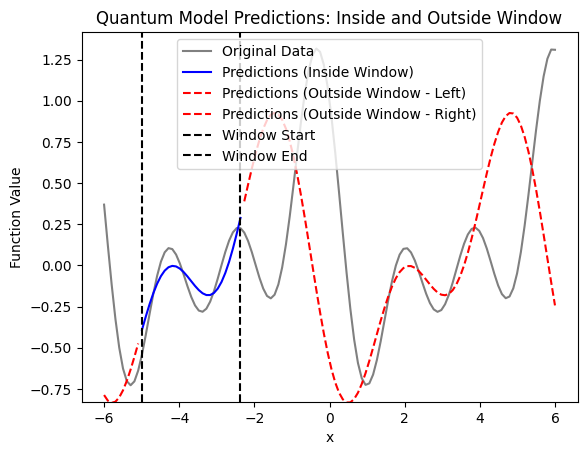

Window End: -2.10, Window Size: 29, R²: 0.694097


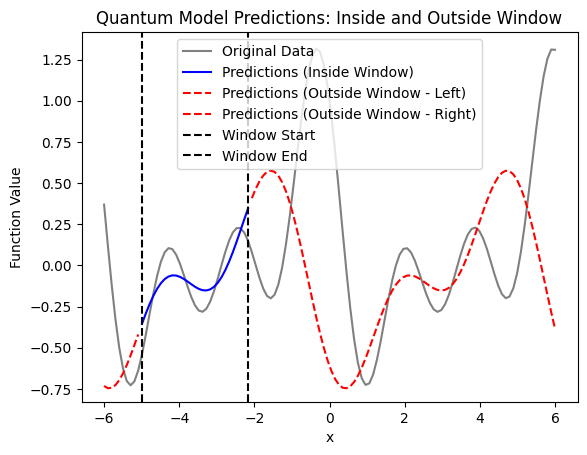

Window End: -1.90, Window Size: 31, R²: 0.541305


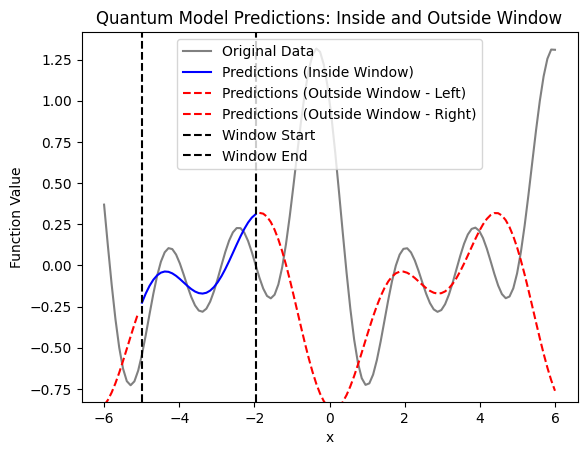

Window End: -1.70, Window Size: 33, R²: 0.511805


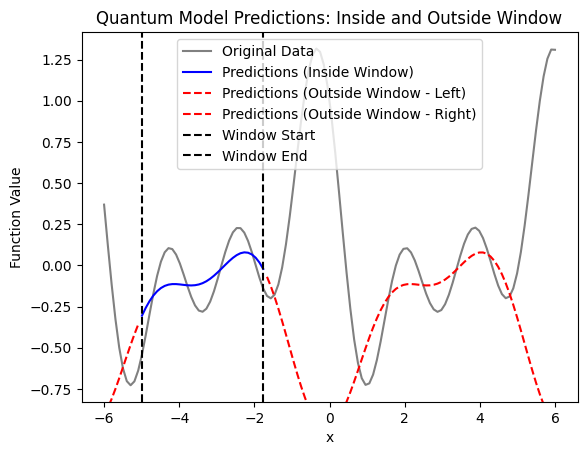

Window End: -1.50, Window Size: 35, R²: 0.252582


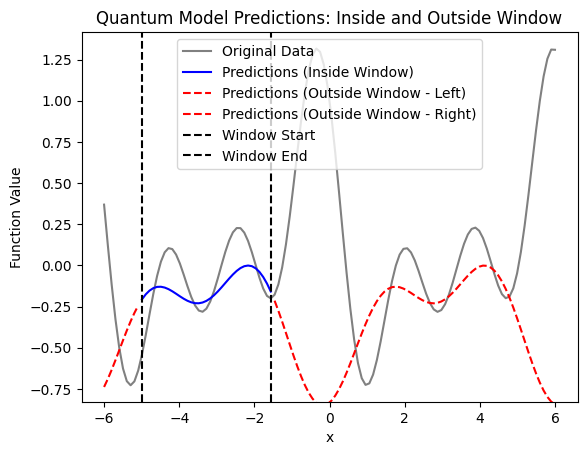

Window End: -1.30, Window Size: 37, R²: 0.431251


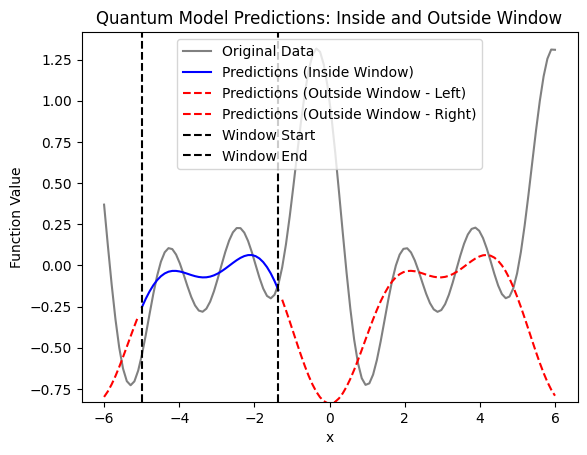

Window End: -1.10, Window Size: 39, R²: 0.248085


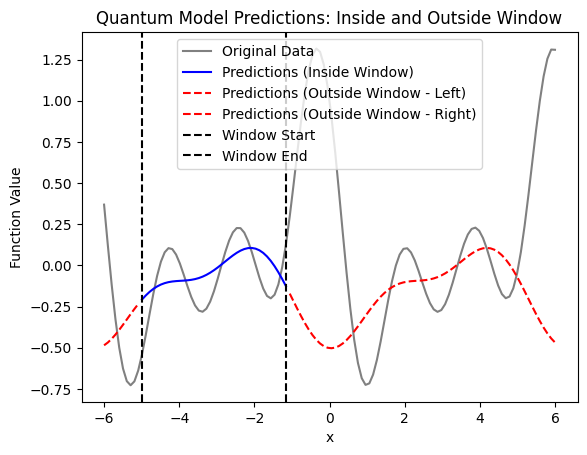

Window End: -0.90, Window Size: 41, R²: 0.099947


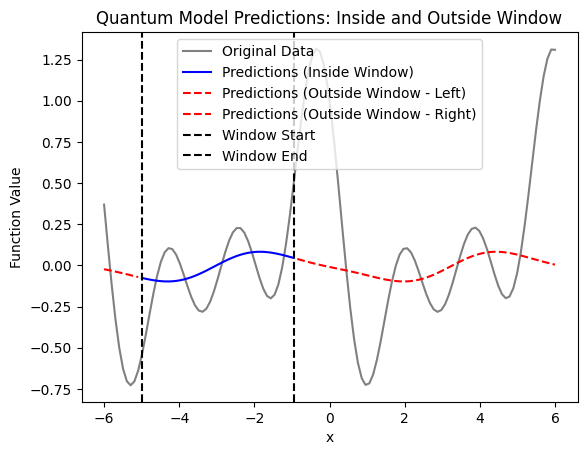

Window End: -0.70, Window Size: 43, R²: 0.284926


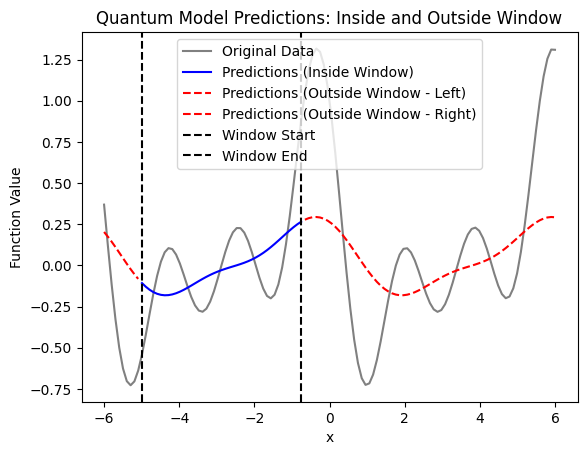

Window End: -0.50, Window Size: 45, R²: 0.522637


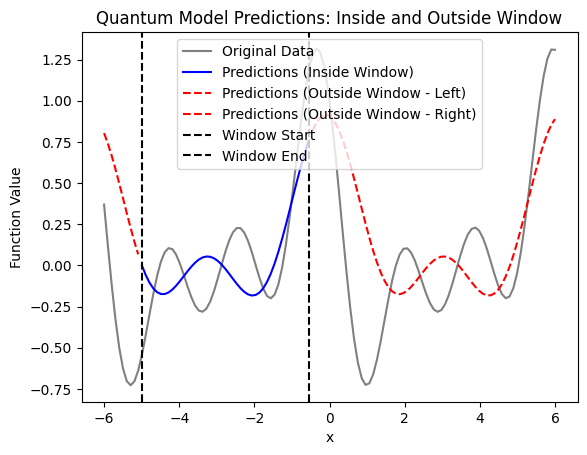

Window End: -0.30, Window Size: 47, R²: 0.642452


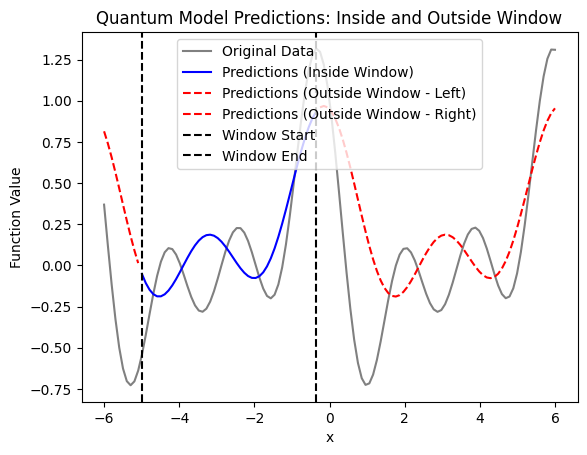

Window End: -0.10, Window Size: 49, R²: 0.716608


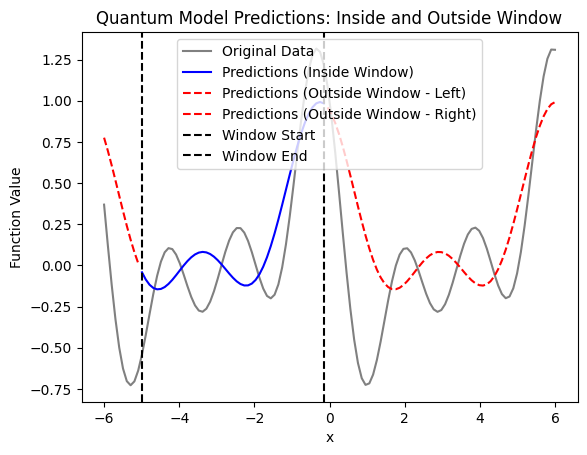

Window End: 0.10, Window Size: 50, R²: 0.701113


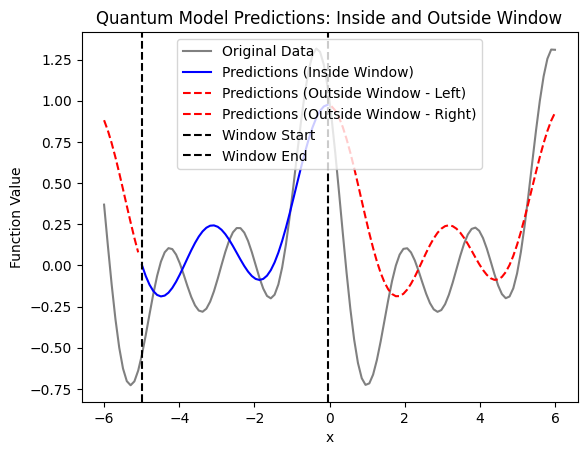

Window End: 0.30, Window Size: 52, R²: 0.753985


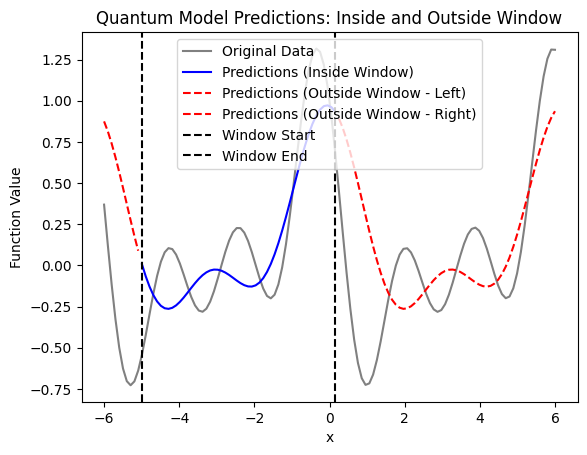

Window End: 0.50, Window Size: 54, R²: 0.712723


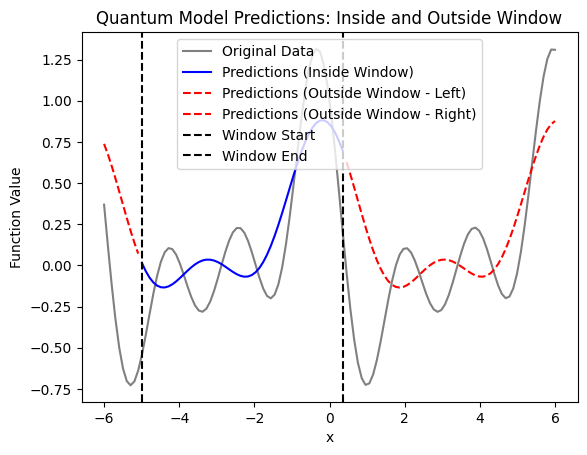

Window End: 0.70, Window Size: 56, R²: 0.647374


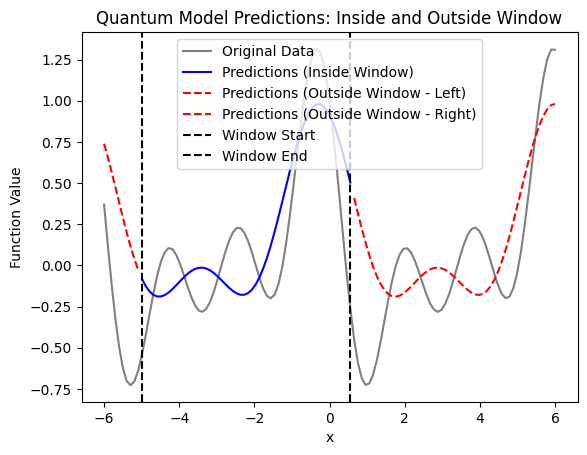

Window End: 0.90, Window Size: 58, R²: 0.593069


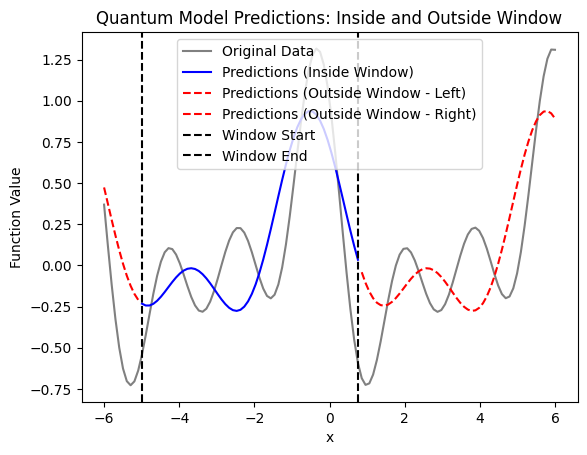

Window End: 1.10, Window Size: 60, R²: 0.622327


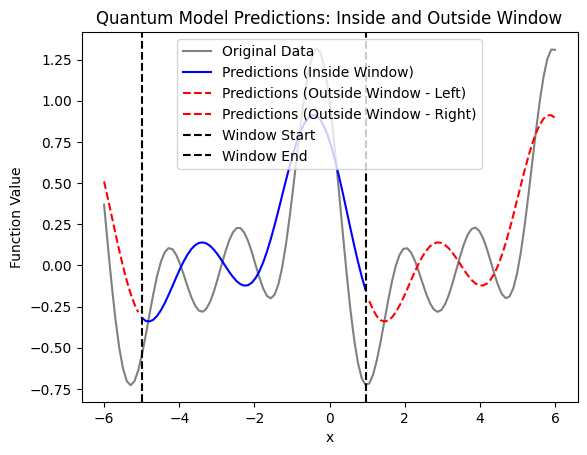

Window End: 1.30, Window Size: 62, R²: 0.629392


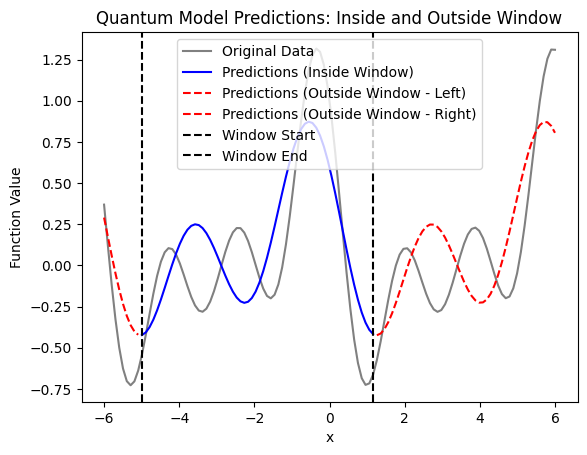

Window End: 1.50, Window Size: 64, R²: 0.660370


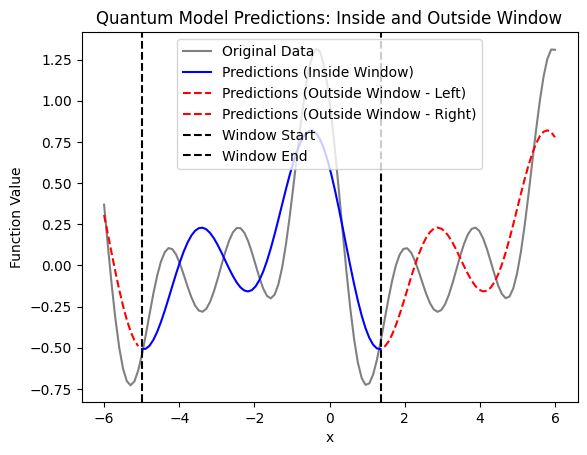

Window End: 1.70, Window Size: 66, R²: 0.554488


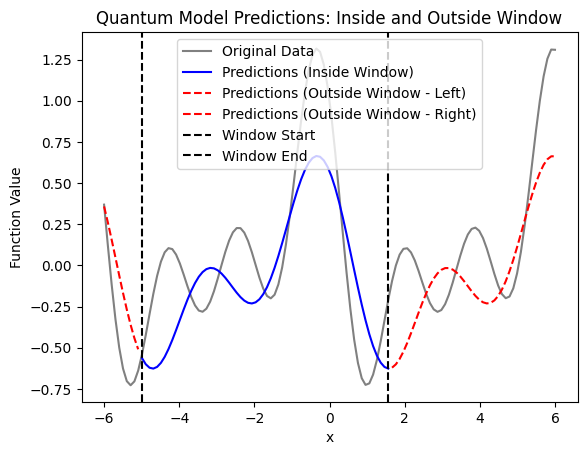

Window End: 1.90, Window Size: 68, R²: 0.658972


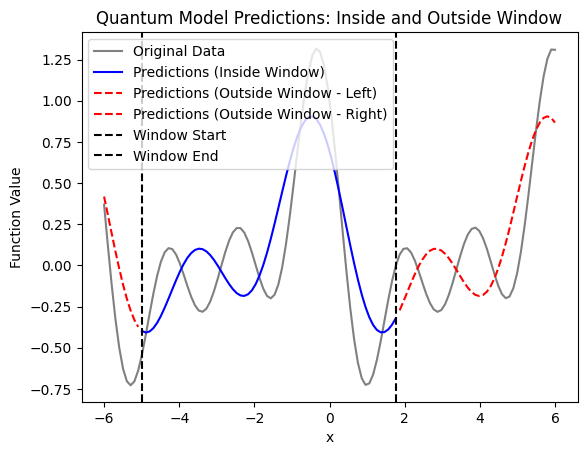

Window End: 2.10, Window Size: 70, R²: 0.603939


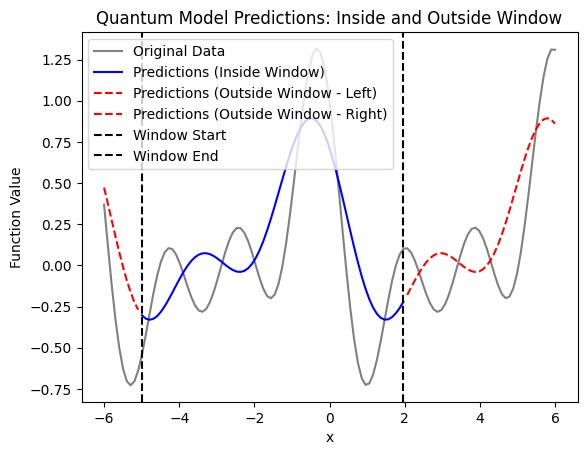

Window End: 2.30, Window Size: 72, R²: 0.594396


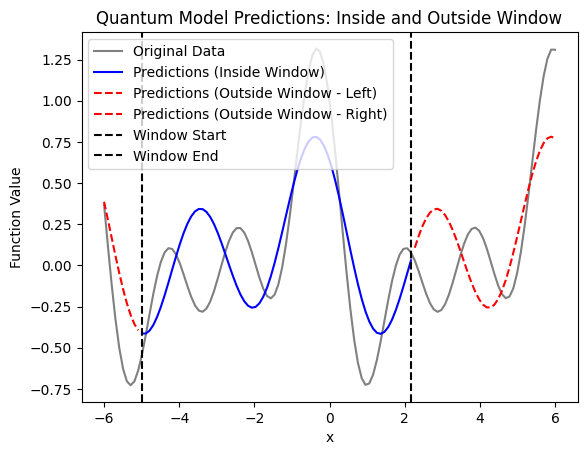

Window End: 2.50, Window Size: 74, R²: 0.579468


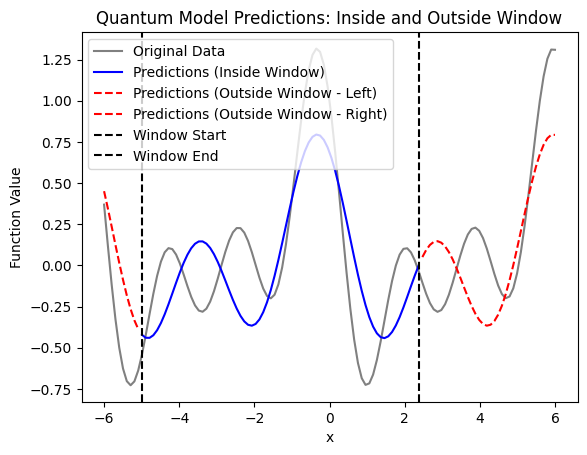

Window End: 2.70, Window Size: 76, R²: 0.587752


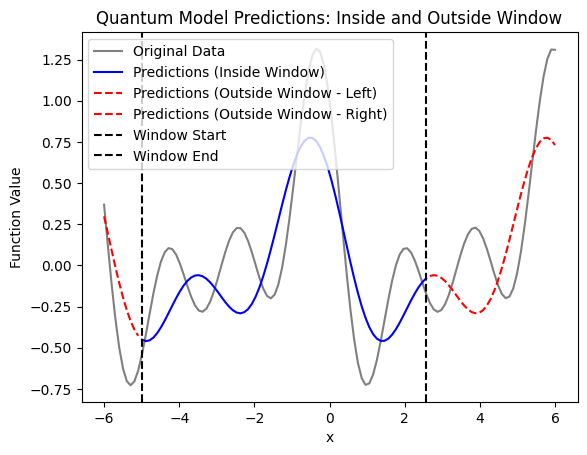

Window End: 2.90, Window Size: 78, R²: 0.610252


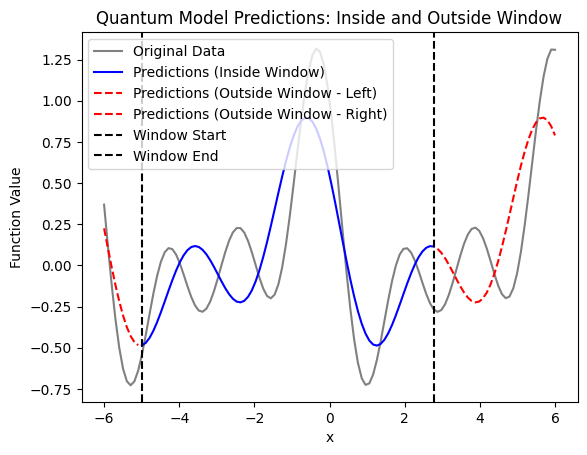

Window End: 3.10, Window Size: 80, R²: 0.606171


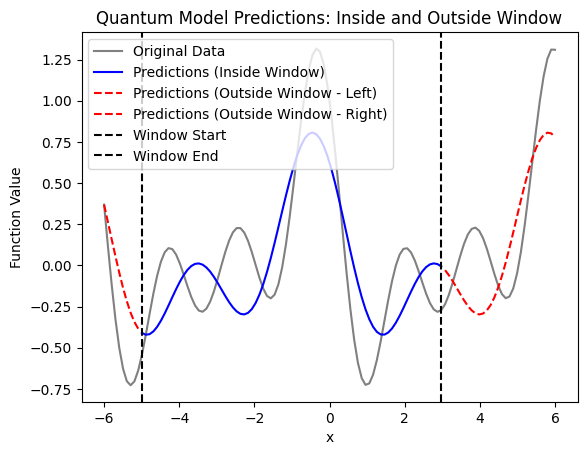

Window End: 3.30, Window Size: 82, R²: 0.593875


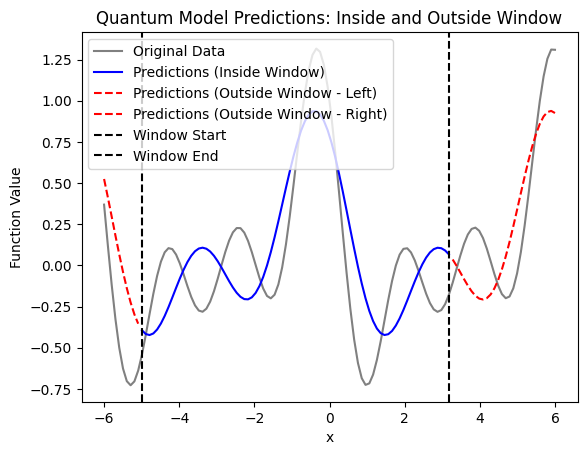

Window End: 3.50, Window Size: 84, R²: 0.592032


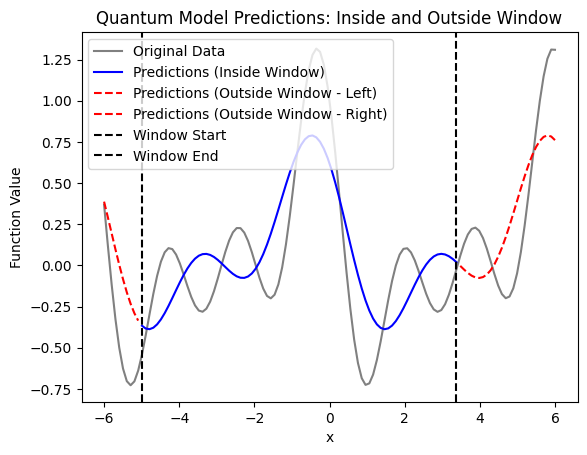

Window End: 3.70, Window Size: 86, R²: 0.409459


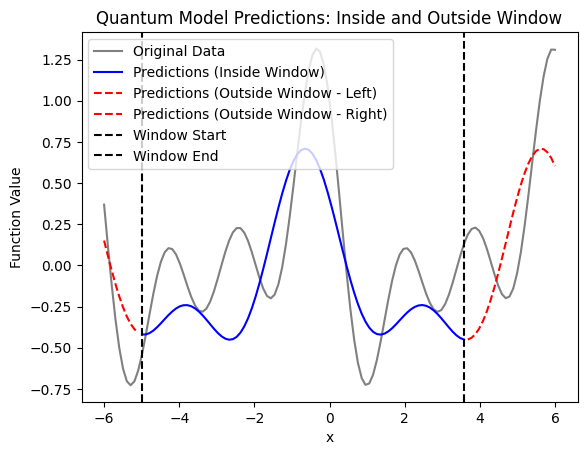

Window End: 3.90, Window Size: 88, R²: 0.451927


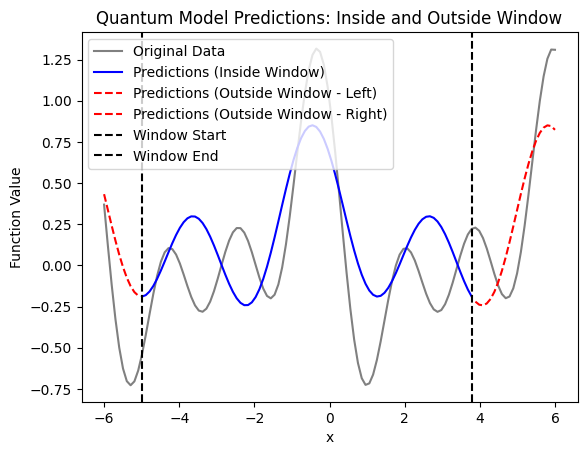

Window End: 4.10, Window Size: 90, R²: 0.519976


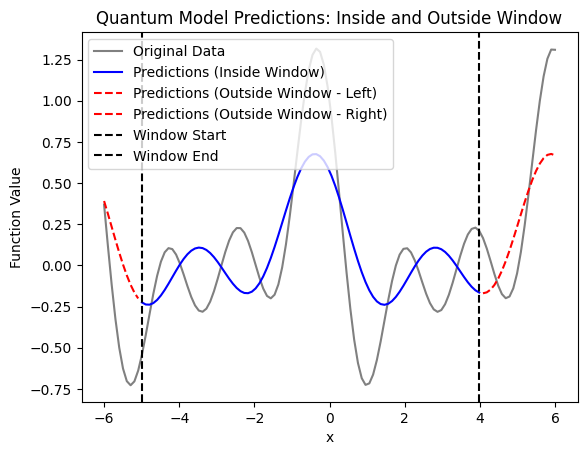

Window End: 4.30, Window Size: 92, R²: 0.555508


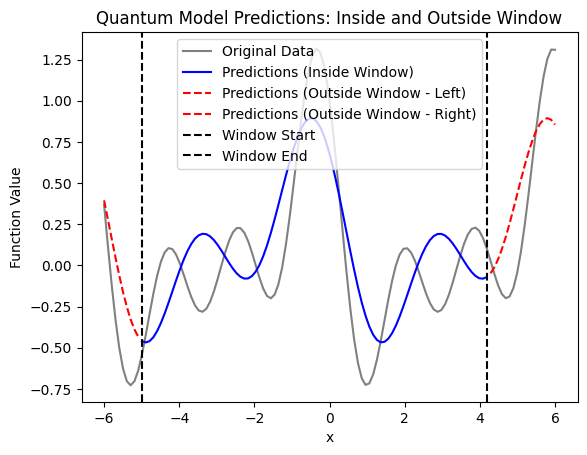

Window End: 4.50, Window Size: 94, R²: 0.550653


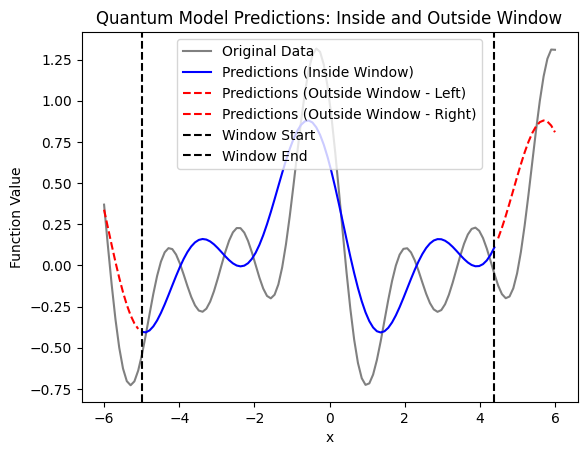

Window End: 4.70, Window Size: 96, R²: 0.553450


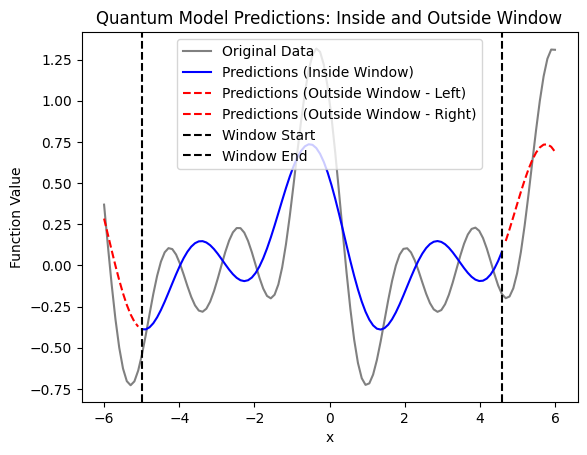

Window End: 4.90, Window Size: 98, R²: 0.481818


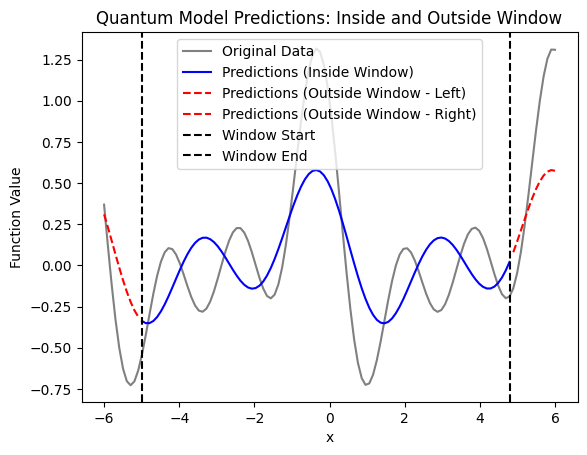

Window End: 5.10, Window Size: 100, R²: 0.510793


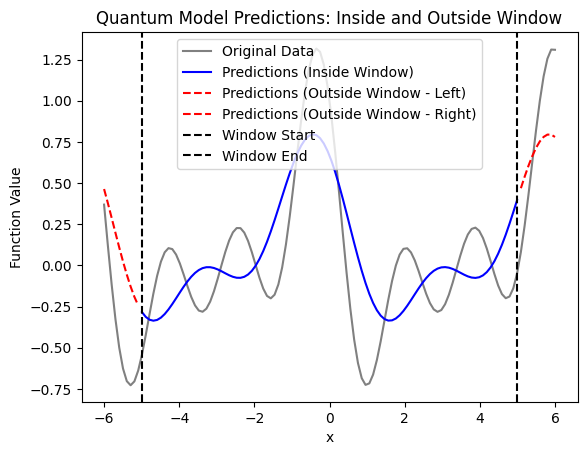

Window End: 5.30, Window Size: 102, R²: 0.430284


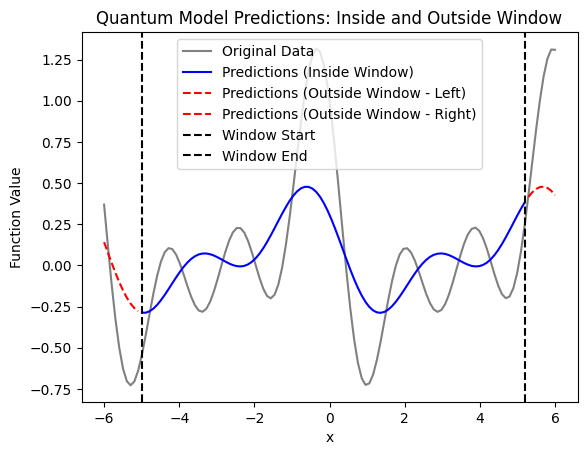

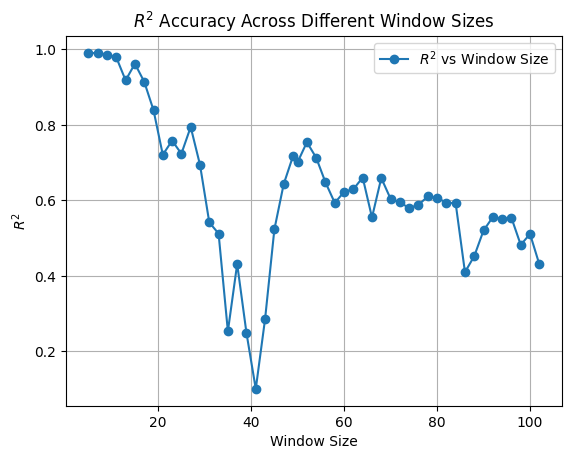

In [ ]:
import matplotlib.pyplot as plt
import pennylane as qml
from pennylane import numpy as np
from pennylane.templates import StronglyEntanglingLayers

np.random.seed(42)

# Set input signal parameters
degree = 3  # degree of the target function
scaling = 1  # scaling of the data
coeffs = [0.15 + 0.15j] * degree  # coefficients of non-zero frequencies
coeff0 = 0.1  # coefficient of zero frequency

sampling_rate = 10  # number of data points per unit interval on the x-axis
(x_axis_left, x_axis_right) = (-6, 6)  # signal's left and right edges

def target_function(x):
    """Generate a truncated Fourier series of degree, where the data gets re-scaled."""
    res = coeff0
    for idx, coeff in enumerate(coeffs):
        exponent = complex(0, scaling * (idx + 1) * x)
        conj_coeff = np.conjugate(coeff)
        res += coeff * np.exp(exponent) + conj_coeff * np.exp(-exponent)
    return np.real(res)

num_data_points = int(sampling_rate * (x_axis_right - x_axis_left))
x = np.linspace(x_axis_left, x_axis_right, num_data_points)
target_y = np.array([target_function(x_) for x_ in x])  # used later for training

# Plot the original target function
plt.plot(x, target_y, c='gray', label='Original Data')
plt.scatter(x, target_y, facecolor='orange', edgecolor='black')
plt.ylim(min(target_y) - 0.1, max(target_y) + 0.1)
plt.legend()
plt.show()

# Rectangular window implementation
def rectangular_window(num_points, start_index, window_size):
    """Create a rectangular window."""
    if window_size > num_points or start_index + window_size > num_points:
        raise ValueError("Window size must fit within the range of data points.")
    window = np.zeros(num_points)
    window[start_index:start_index + window_size] = 1
    return window

################# 1. QUANTUM MODEL DESCRIPTION #################

n_qubits = 3
dev = qml.device('default.qubit', wires=n_qubits)

def square_loss(targets, predictions):
    loss = 0
    for t, p in zip(targets, predictions):
        loss = loss + (t - p) ** 2
    loss = loss / len(targets)
    return 0.5 * loss

def S(x):
    for w in range(n_qubits):
        qml.RX(scaling * x, wires=w)

def W(theta):
    StronglyEntanglingLayers(theta, wires=range(n_qubits))

@qml.qnode(dev)
def quantum_model(weights, x=None):
    W(weights[0])
    S(x)
    W(weights[1])
    return qml.expval(qml.PauliZ(wires=0))

# Initialize weights for the quantum layers
trainable_block_layers = 1  # Set the number of trainable circuit block layers.
weights = 2 * np.pi * np.random.random(size=(2, trainable_block_layers, n_qubits, 3))

################# 2. WINDOW SIZE LOOP #################

# Customizable window parameters
window_start_x = -5  # Fixed window start
window_end_start = -4.5  # Starting window end
window_end_stop = 5.5  # Final window end
window_increment = 0.2  # Increment for window end

# Store results for plotting
window_sizes = []
r2_values = []

for window_end_x in np.arange(window_end_start, window_end_stop, window_increment):
    # Convert x values to indices for the rectangular window
    start_index = np.argmin(np.abs(x - window_start_x))
    end_index = np.argmin(np.abs(x - window_end_x))
    window_size = end_index - start_index
    window = rectangular_window(num_data_points, start_index, window_size)
    windowed_target_y = target_y * window

    # Training configuration
    max_batch_size = 25  # Batch size limit
    max_steps = 60
    opt = qml.AdamOptimizer(0.3)
    batch_size = min(window_size, max_batch_size)

    cst = []
    for step in range(max_steps):
        batch_indices = np.random.choice(range(start_index, start_index + window_size), size=batch_size, replace=False)
        x_batch = x[batch_indices]
        y_batch = windowed_target_y[batch_indices]

        weights = opt.step(lambda w: square_loss(y_batch, [quantum_model(w, x=x_) for x_ in x_batch]), weights)
        c = square_loss(y_batch, [quantum_model(weights, x=x_) for x_ in x_batch])
        cst.append(c)

    # Calculate R² for the patch
    predictions = [quantum_model(weights, x=x_) for x_ in x]
    predictions_patch = predictions[start_index:start_index + window_size]
    target_patch = target_y[start_index:start_index + window_size]

    sst_patch = np.sum((target_patch - np.mean(target_patch)) ** 2)
    sse_patch = np.sum((target_patch - predictions_patch) ** 2)
    r2_patch = 1 - (sse_patch / sst_patch) if sst_patch != 0 else np.nan

    print(f"Window End: {window_end_x:.2f}, Window Size: {window_size}, R²: {r2_patch:.6f}")
    window_sizes.append(window_size)
    r2_values.append(r2_patch)

    ################# 3. PLOTS got each window size loop #################

    # Plot predictions inside and outside the window
    plt.plot(x, target_y, c='gray', label='Original Data')

    # Inside the window
    plt.plot(x[start_index:start_index + window_size],
            predictions[start_index:start_index + window_size],
            c='blue', label='Predictions (Inside Window)')

    # Outside the window (left)
    plt.plot(x[:start_index], predictions[:start_index],
            c='red', linestyle='dashed', label='Predictions (Outside Window - Left)')

    # Outside the window (right)
    plt.plot(x[start_index + window_size:], predictions[start_index + window_size:],
            c='red', linestyle='dashed', label='Predictions (Outside Window - Right)')

    # Styling and legends
    plt.ylim(min(target_y) - 0.1, max(target_y) + 0.1)
    plt.axvline(x[start_index], color='black', linestyle='--', label='Window Start')
    plt.axvline(x[start_index + window_size - 1], color='black', linestyle='--', label='Window End')
    plt.legend()
    plt.title("Quantum Model Predictions: Inside and Outside Window")
    plt.xlabel("x")
    plt.ylabel("Function Value")
    plt.show()


################# 4. PLOTS #################

# Plot R² vs Window Size
plt.plot(window_sizes, r2_values, marker='o', label='$R^2$ vs Window Size')
plt.xlabel("Window Size")
plt.ylabel("$R^2$")
plt.title("$R^2$ Accuracy Across Different Window Sizes")
plt.legend()
plt.grid()
plt.show()


# 1 qubit 1 layer

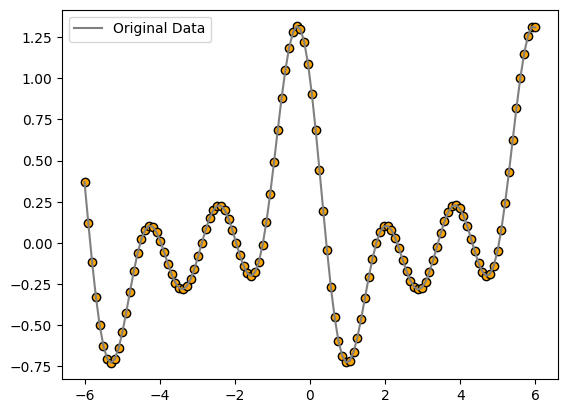

Window End: -4.50, Window Size: 5, R²: 0.924457


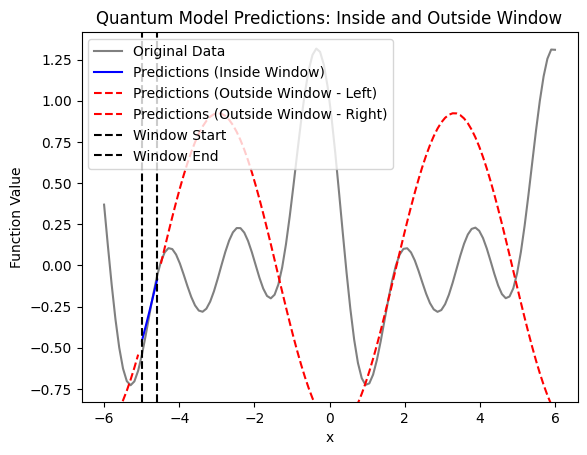

Window End: -4.30, Window Size: 7, R²: 0.970299


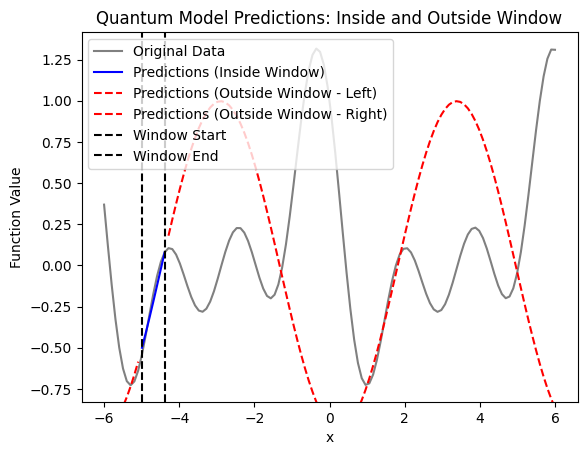

Window End: -4.10, Window Size: 9, R²: 0.927053


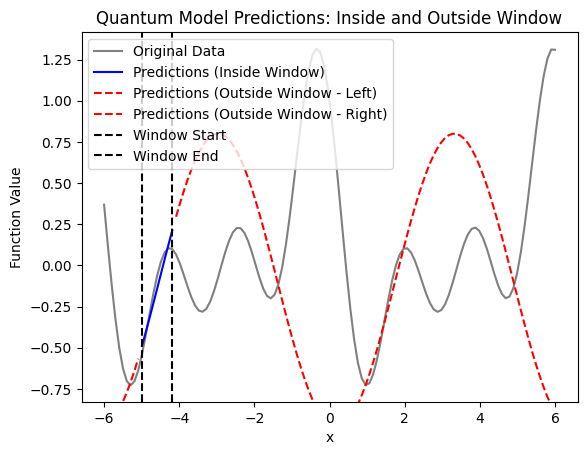

Window End: -3.90, Window Size: 11, R²: 0.820300


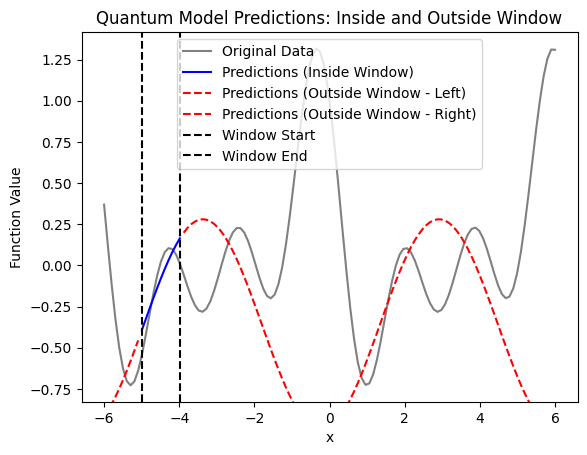

Window End: -3.70, Window Size: 13, R²: 0.629648


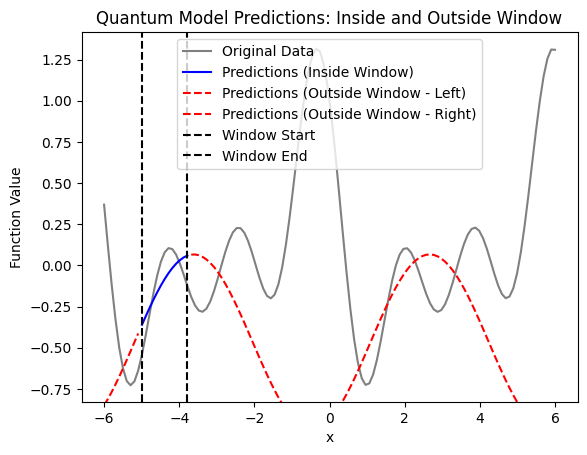

Window End: -3.50, Window Size: 15, R²: 0.472708


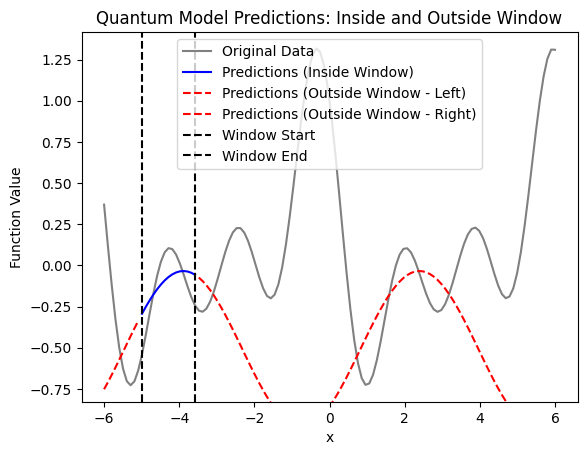

Window End: -3.30, Window Size: 17, R²: 0.427857


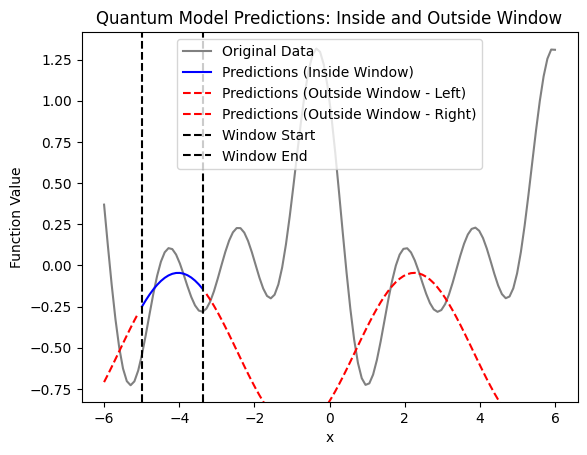

Window End: -3.10, Window Size: 19, R²: 0.442093


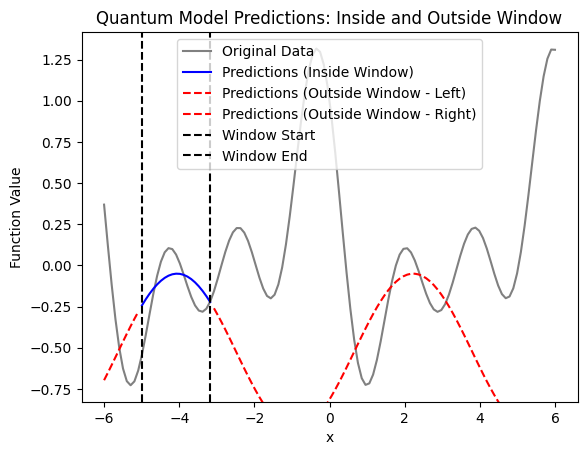

Window End: -2.90, Window Size: 21, R²: 0.365247


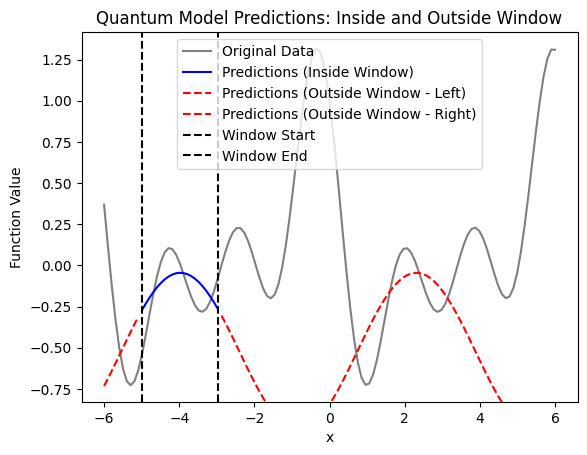

Window End: -2.70, Window Size: 23, R²: 0.116324


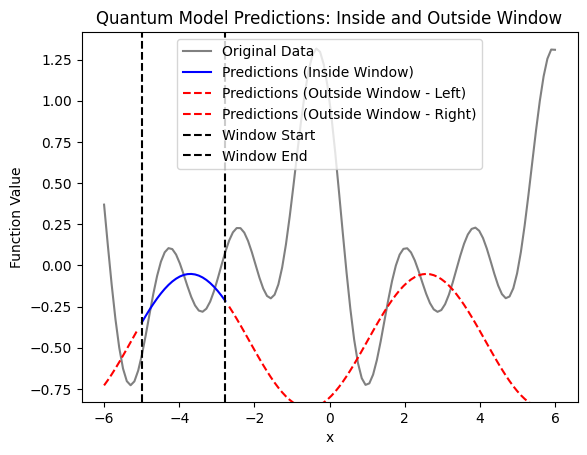

Window End: -2.50, Window Size: 25, R²: 0.092843


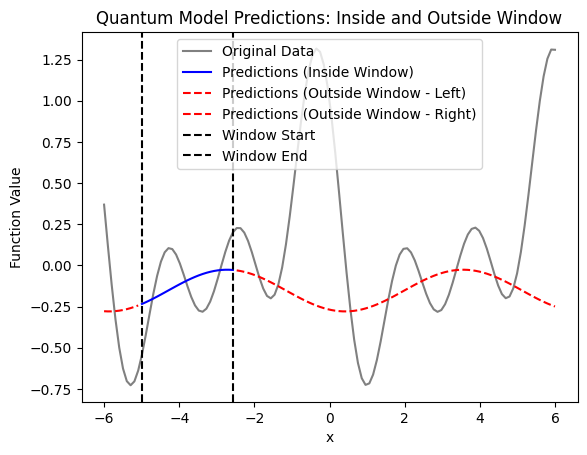

Window End: -2.30, Window Size: 27, R²: 0.172145


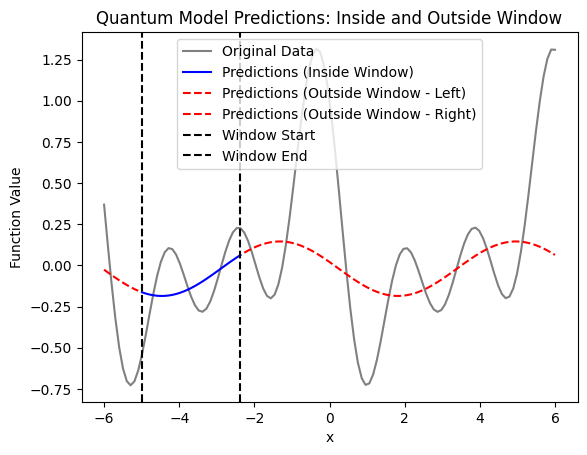

Window End: -2.10, Window Size: 29, R²: 0.243274


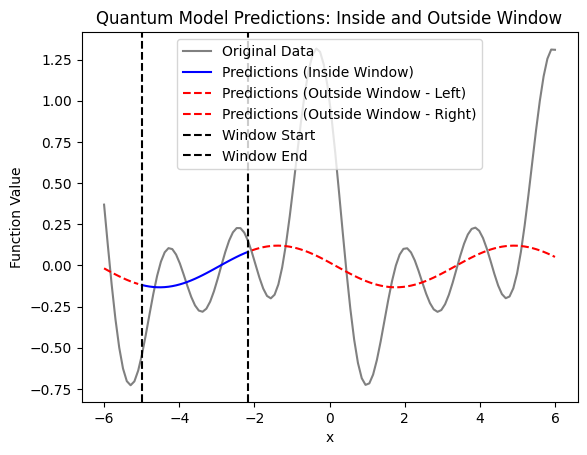

Window End: -1.90, Window Size: 31, R²: 0.228944


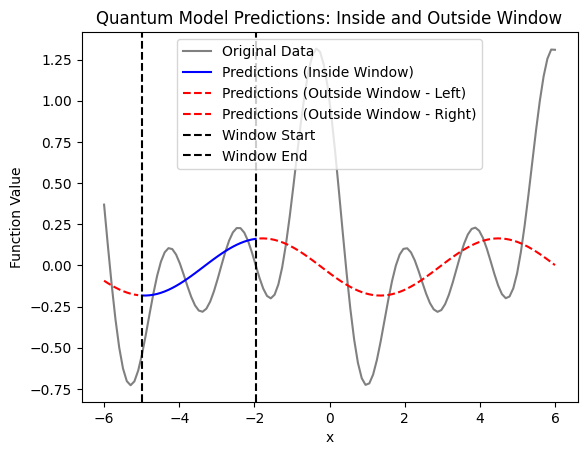

Window End: -1.70, Window Size: 33, R²: 0.123308


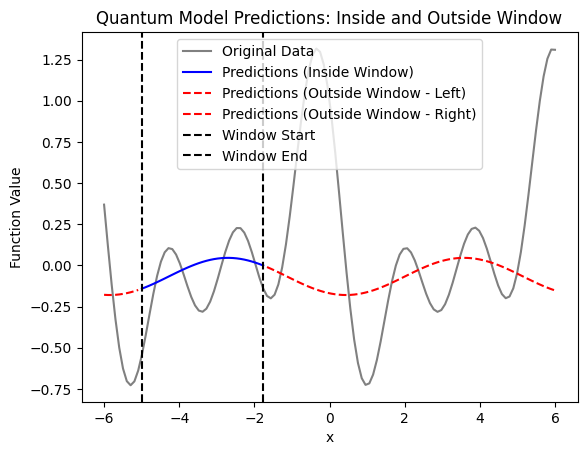

Window End: -1.50, Window Size: 35, R²: 0.162781


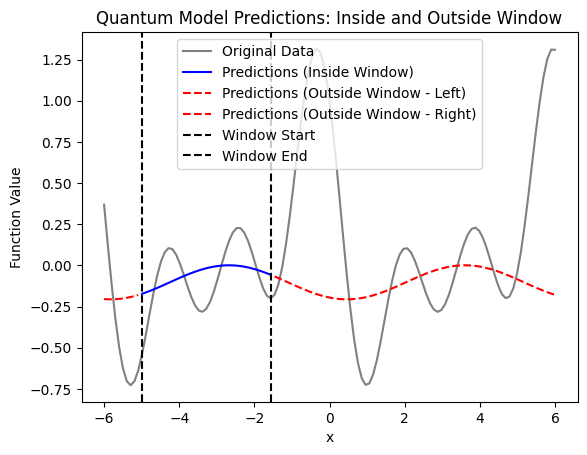

Window End: -1.30, Window Size: 37, R²: 0.113629


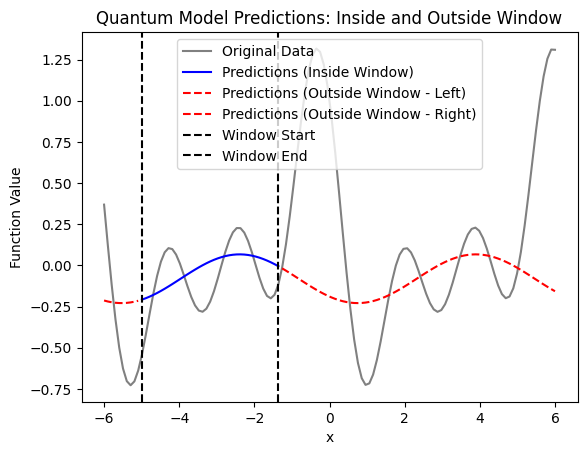

Window End: -1.10, Window Size: 39, R²: 0.121215


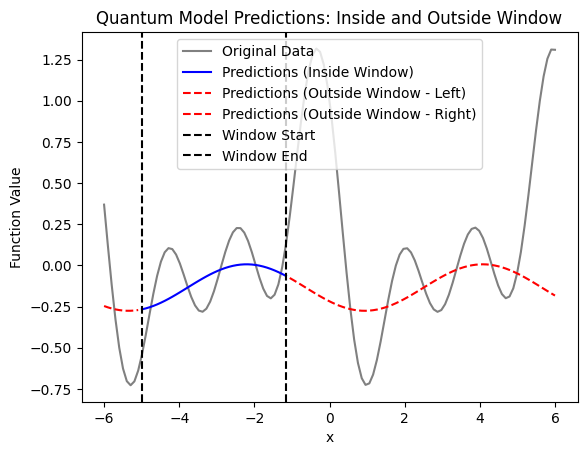

Window End: -0.90, Window Size: 41, R²: 0.066624


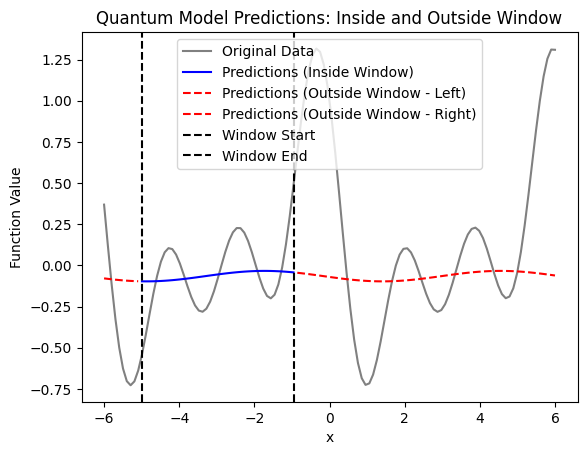

Window End: -0.70, Window Size: 43, R²: 0.194896


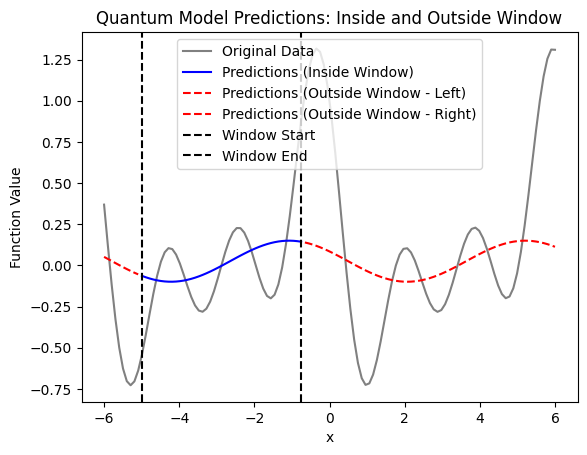

Window End: -0.50, Window Size: 45, R²: 0.254676


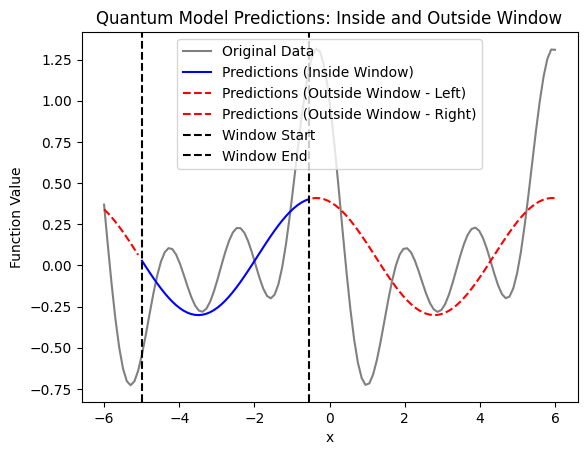

Window End: -0.30, Window Size: 47, R²: 0.408292


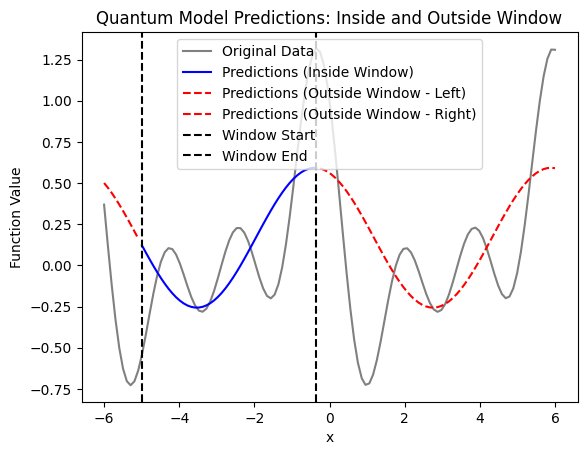

Window End: -0.10, Window Size: 49, R²: 0.418037


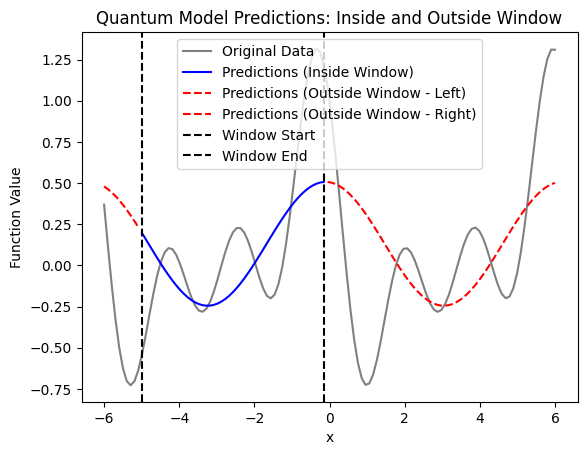

Window End: 0.10, Window Size: 50, R²: 0.492087


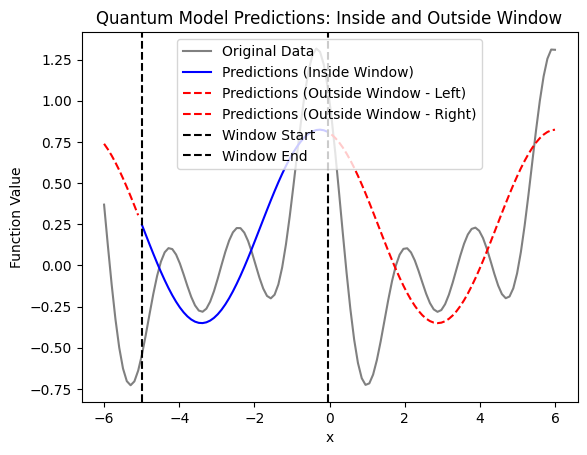

Window End: 0.30, Window Size: 52, R²: 0.503735


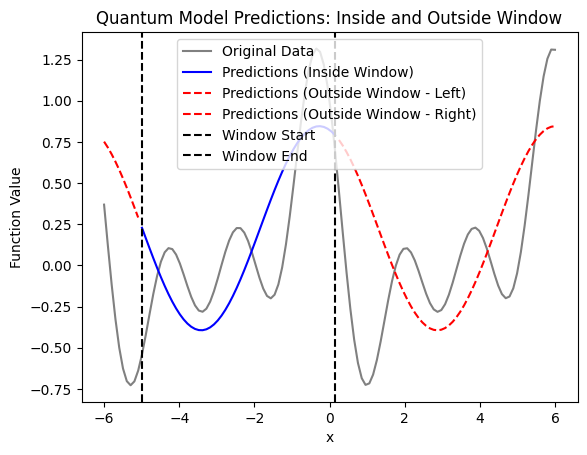

Window End: 0.50, Window Size: 54, R²: 0.438857


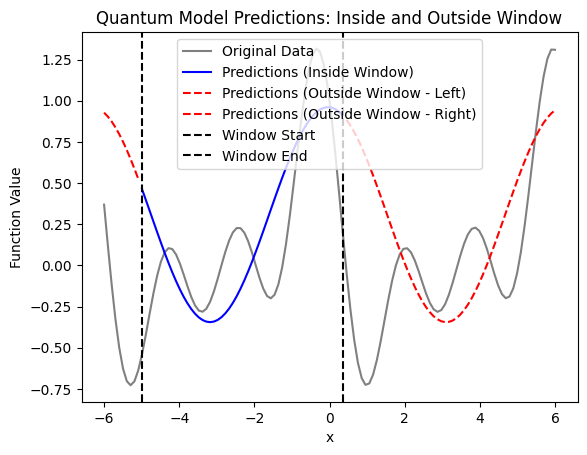

Window End: 0.70, Window Size: 56, R²: 0.441691


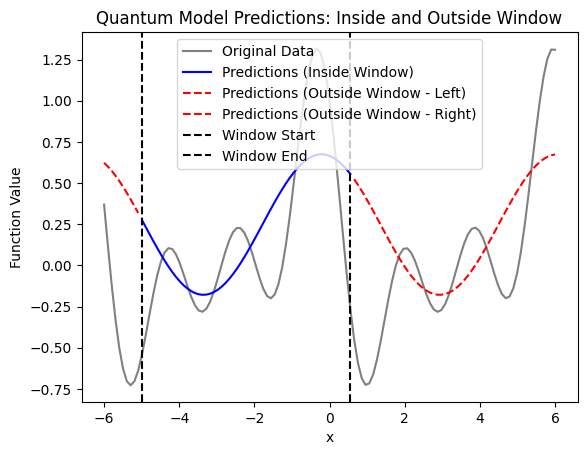

Window End: 0.90, Window Size: 58, R²: 0.359785


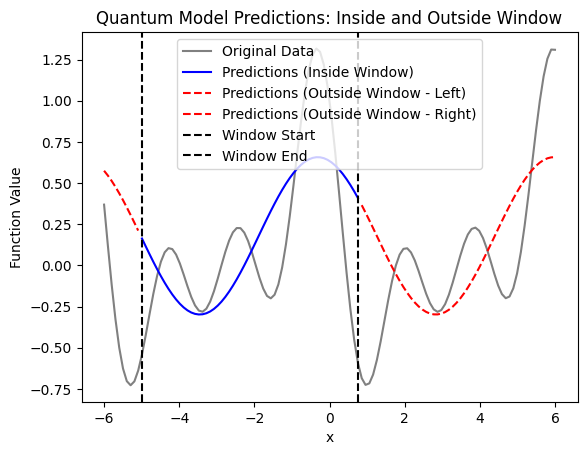

Window End: 1.10, Window Size: 60, R²: 0.254963


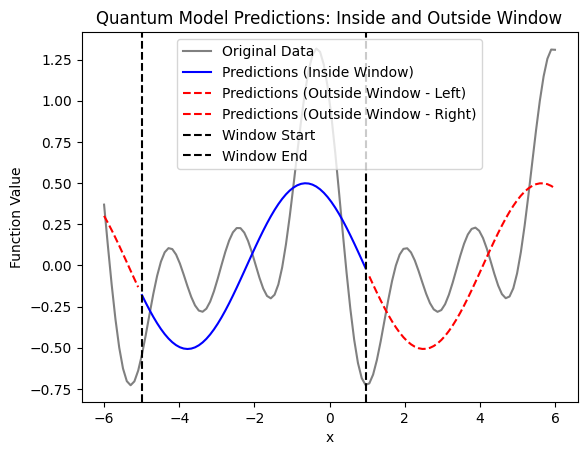

Window End: 1.30, Window Size: 62, R²: 0.221682


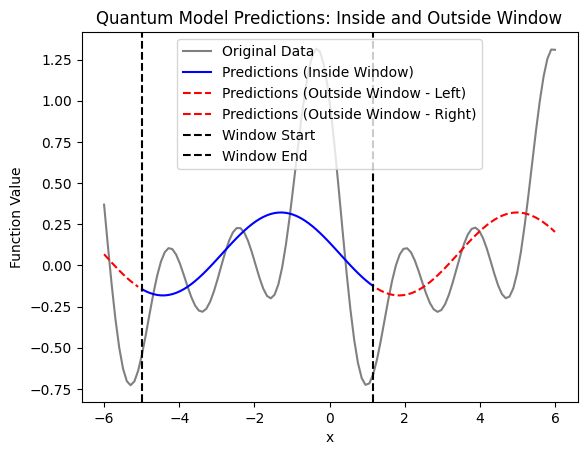

Window End: 1.50, Window Size: 64, R²: 0.335223


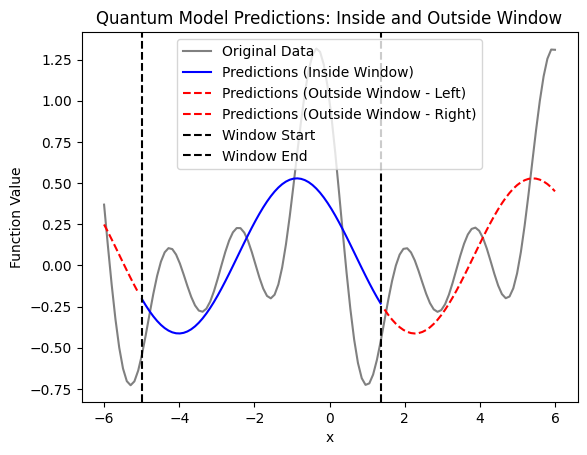

Window End: 1.70, Window Size: 66, R²: 0.344170


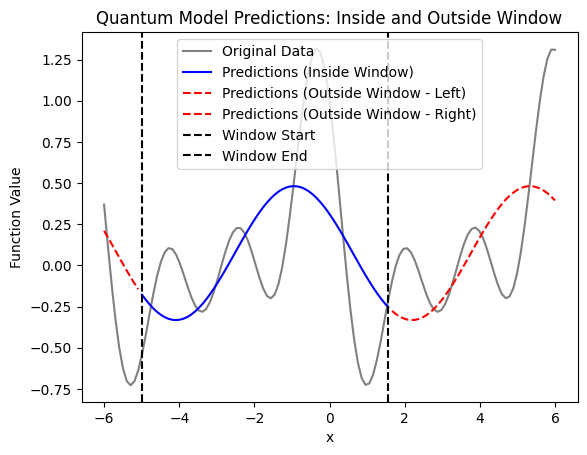

Window End: 1.90, Window Size: 68, R²: 0.302069


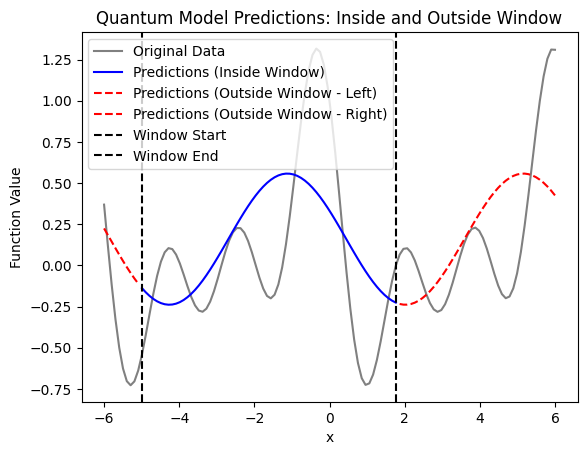

Window End: 2.10, Window Size: 70, R²: 0.279666


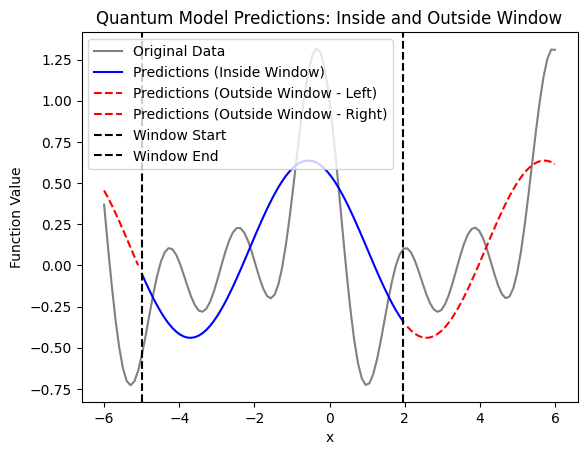

Window End: 2.30, Window Size: 72, R²: 0.200051


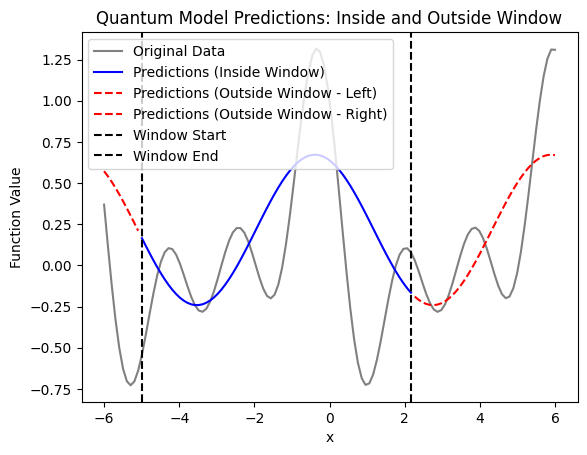

Window End: 2.50, Window Size: 74, R²: 0.182452


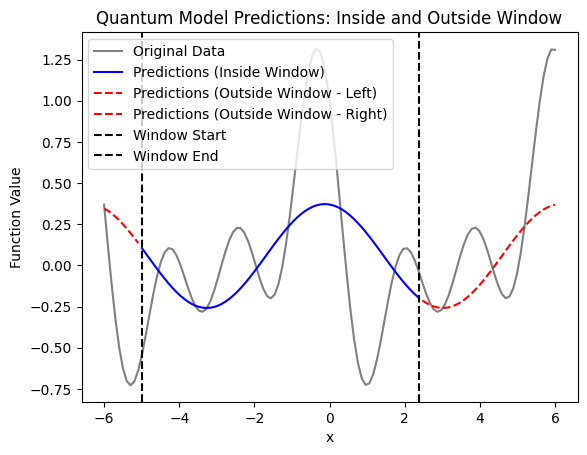

Window End: 2.70, Window Size: 76, R²: 0.283573


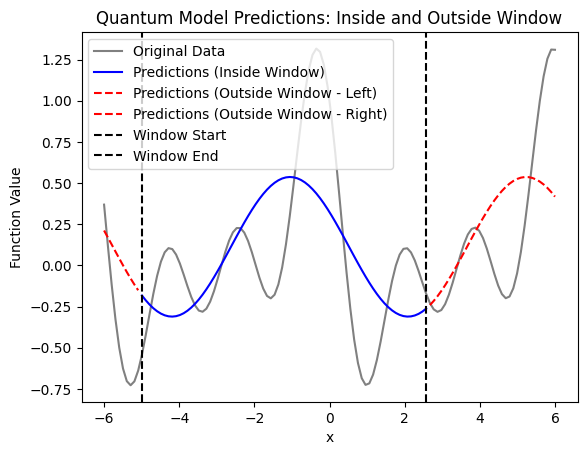

Window End: 2.90, Window Size: 78, R²: 0.309850


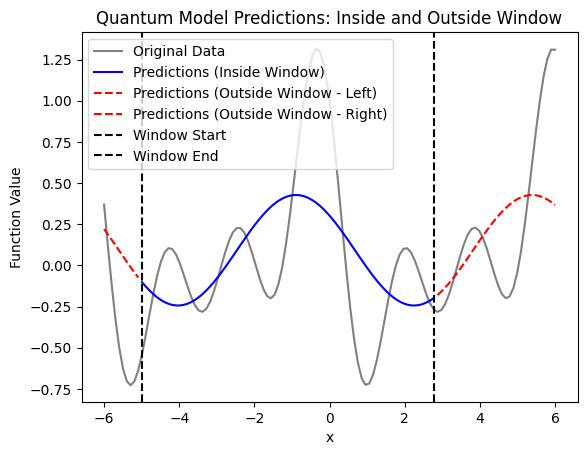

Window End: 3.10, Window Size: 80, R²: 0.303850


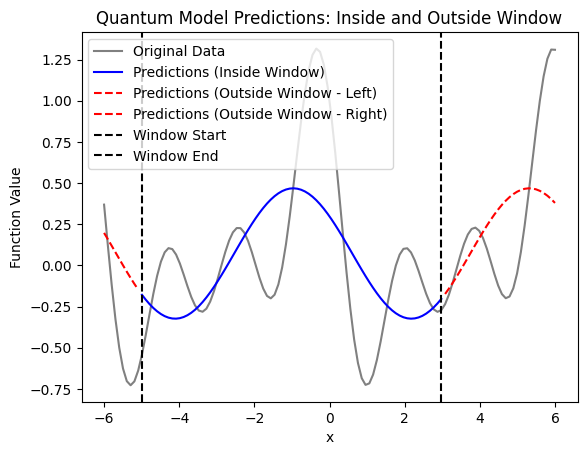

Window End: 3.30, Window Size: 82, R²: 0.270671


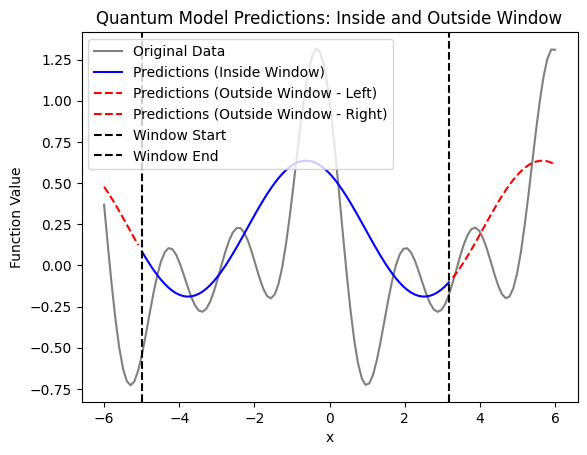

Window End: 3.50, Window Size: 84, R²: 0.149997


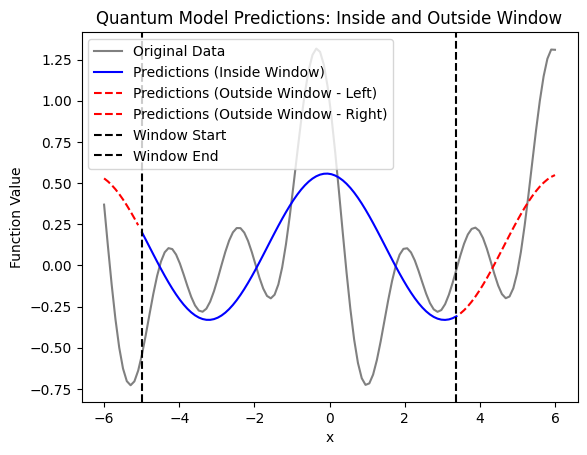

Window End: 3.70, Window Size: 86, R²: 0.268893


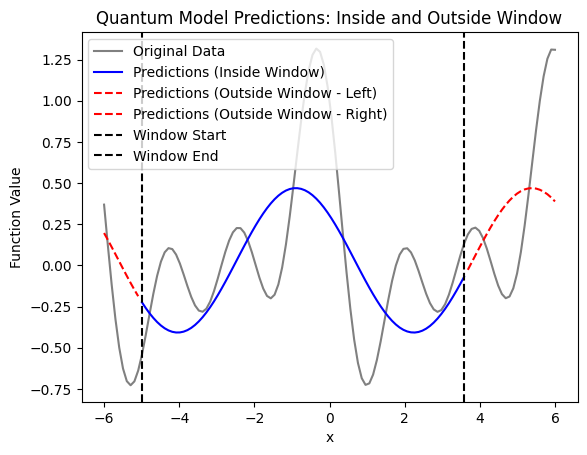

Window End: 3.90, Window Size: 88, R²: 0.290045


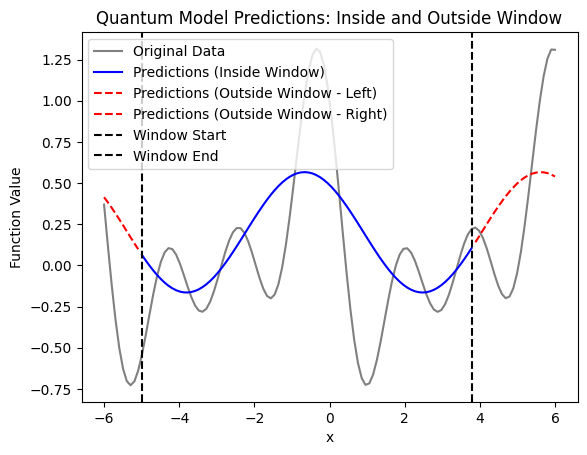

Window End: 4.10, Window Size: 90, R²: 0.320869


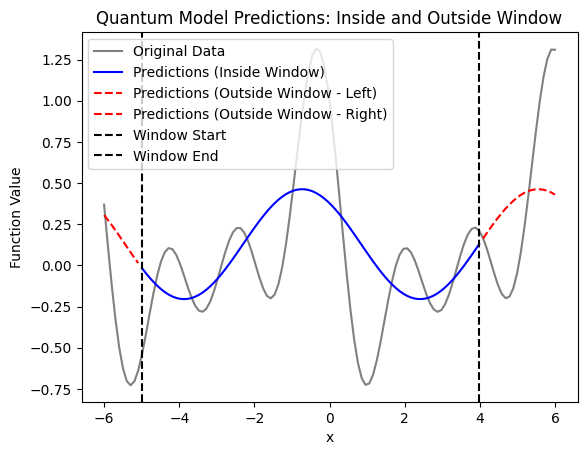

Window End: 4.30, Window Size: 92, R²: 0.285277


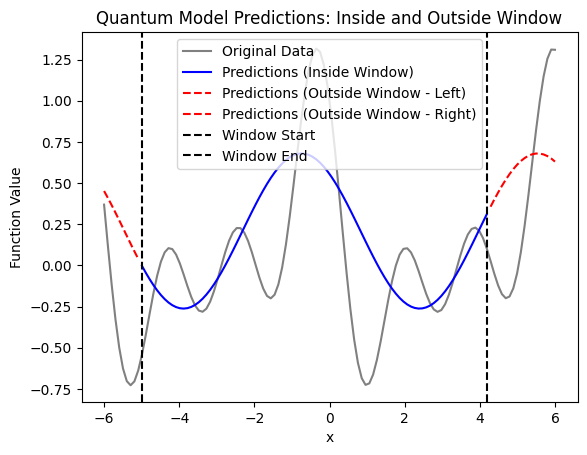

Window End: 4.50, Window Size: 94, R²: 0.271680


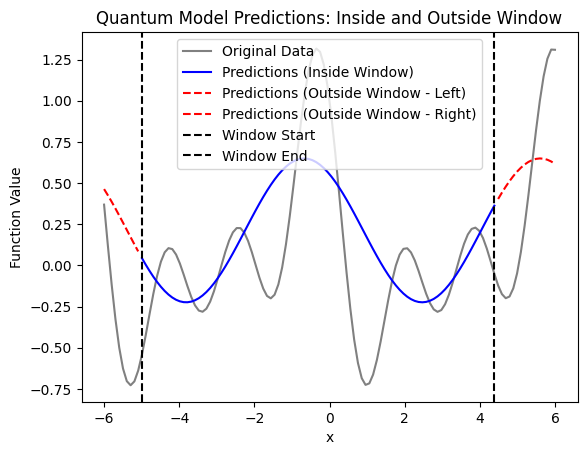

Window End: 4.70, Window Size: 96, R²: 0.259615


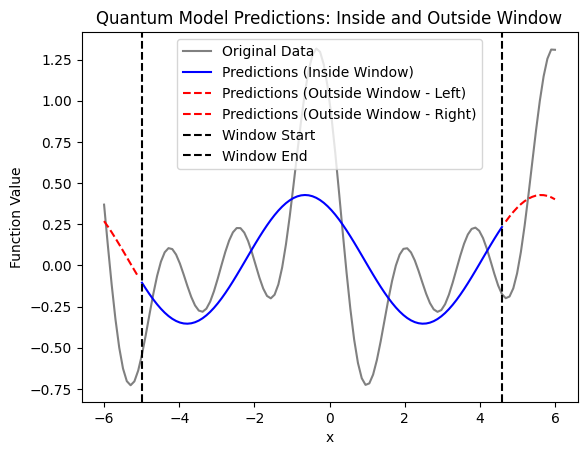

Window End: 4.90, Window Size: 98, R²: 0.209227


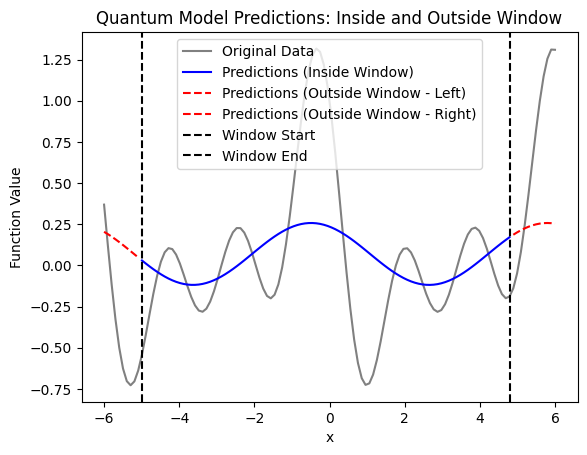

Window End: 5.10, Window Size: 100, R²: 0.249493


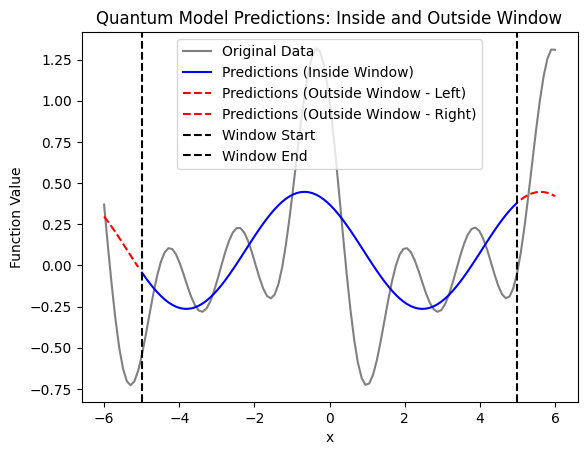

Window End: 5.30, Window Size: 102, R²: 0.166690


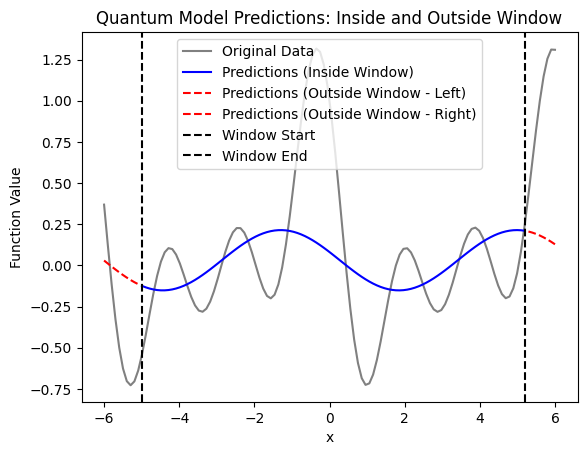

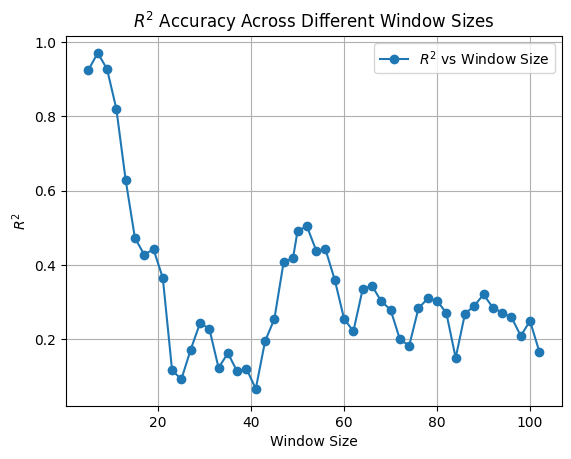

In [ ]:
import matplotlib.pyplot as plt
import pennylane as qml
from pennylane import numpy as np
from pennylane.templates import StronglyEntanglingLayers

np.random.seed(42)

# Set input signal parameters
degree = 3  # degree of the target function
scaling = 1  # scaling of the data
coeffs = [0.15 + 0.15j] * degree  # coefficients of non-zero frequencies
coeff0 = 0.1  # coefficient of zero frequency

sampling_rate = 10  # number of data points per unit interval on the x-axis
(x_axis_left, x_axis_right) = (-6, 6)  # signal's left and right edges

def target_function(x):
    """Generate a truncated Fourier series of degree, where the data gets re-scaled."""
    res = coeff0
    for idx, coeff in enumerate(coeffs):
        exponent = complex(0, scaling * (idx + 1) * x)
        conj_coeff = np.conjugate(coeff)
        res += coeff * np.exp(exponent) + conj_coeff * np.exp(-exponent)
    return np.real(res)

num_data_points = int(sampling_rate * (x_axis_right - x_axis_left))
x = np.linspace(x_axis_left, x_axis_right, num_data_points)
target_y = np.array([target_function(x_) for x_ in x])  # used later for training

# Plot the original target function
plt.plot(x, target_y, c='gray', label='Original Data')
plt.scatter(x, target_y, facecolor='orange', edgecolor='black')
plt.ylim(min(target_y) - 0.1, max(target_y) + 0.1)
plt.legend()
plt.show()

# Rectangular window implementation
def rectangular_window(num_points, start_index, window_size):
    """Create a rectangular window."""
    if window_size > num_points or start_index + window_size > num_points:
        raise ValueError("Window size must fit within the range of data points.")
    window = np.zeros(num_points)
    window[start_index:start_index + window_size] = 1
    return window

################# 1. QUANTUM MODEL DESCRIPTION #################

n_qubits = 1
dev = qml.device('default.qubit', wires=n_qubits)

def square_loss(targets, predictions):
    loss = 0
    for t, p in zip(targets, predictions):
        loss = loss + (t - p) ** 2
    loss = loss / len(targets)
    return 0.5 * loss

def S(x):
    for w in range(n_qubits):
        qml.RX(scaling * x, wires=w)

def W(theta):
    StronglyEntanglingLayers(theta, wires=range(n_qubits))

@qml.qnode(dev)
def quantum_model(weights, x=None):
    W(weights[0])
    S(x)
    W(weights[1])
    return qml.expval(qml.PauliZ(wires=0))

# Initialize weights for the quantum layers
trainable_block_layers = 1  # Set the number of trainable circuit block layers.
weights = 2 * np.pi * np.random.random(size=(2, trainable_block_layers, n_qubits, 3))

################# 2. WINDOW SIZE LOOP #################

# Customizable window parameters
window_start_x = -5  # Fixed window start
window_end_start = -4.5  # Starting window end
window_end_stop = 5.5  # Final window end
window_increment = 0.2  # Increment for window end

# Store results for plotting
window_sizes = []
r2_values = []

for window_end_x in np.arange(window_end_start, window_end_stop, window_increment):
    # Convert x values to indices for the rectangular window
    start_index = np.argmin(np.abs(x - window_start_x))
    end_index = np.argmin(np.abs(x - window_end_x))
    window_size = end_index - start_index
    window = rectangular_window(num_data_points, start_index, window_size)
    windowed_target_y = target_y * window

    # Training configuration
    max_batch_size = 25  # Batch size limit
    max_steps = 60
    opt = qml.AdamOptimizer(0.3)
    batch_size = min(window_size, max_batch_size)

    cst = []
    for step in range(max_steps):
        batch_indices = np.random.choice(range(start_index, start_index + window_size), size=batch_size, replace=False)
        x_batch = x[batch_indices]
        y_batch = windowed_target_y[batch_indices]

        weights = opt.step(lambda w: square_loss(y_batch, [quantum_model(w, x=x_) for x_ in x_batch]), weights)
        c = square_loss(y_batch, [quantum_model(weights, x=x_) for x_ in x_batch])
        cst.append(c)

    # Calculate R² for the patch
    predictions = [quantum_model(weights, x=x_) for x_ in x]
    predictions_patch = predictions[start_index:start_index + window_size]
    target_patch = target_y[start_index:start_index + window_size]

    sst_patch = np.sum((target_patch - np.mean(target_patch)) ** 2)
    sse_patch = np.sum((target_patch - predictions_patch) ** 2)
    r2_patch = 1 - (sse_patch / sst_patch) if sst_patch != 0 else np.nan

    print(f"Window End: {window_end_x:.2f}, Window Size: {window_size}, R²: {r2_patch:.6f}")
    window_sizes.append(window_size)
    r2_values.append(r2_patch)

    ################# 3. PLOTS got each window size loop #################

    # Plot predictions inside and outside the window
    plt.plot(x, target_y, c='gray', label='Original Data')

    # Inside the window
    plt.plot(x[start_index:start_index + window_size],
            predictions[start_index:start_index + window_size],
            c='blue', label='Predictions (Inside Window)')

    # Outside the window (left)
    plt.plot(x[:start_index], predictions[:start_index],
            c='red', linestyle='dashed', label='Predictions (Outside Window - Left)')

    # Outside the window (right)
    plt.plot(x[start_index + window_size:], predictions[start_index + window_size:],
            c='red', linestyle='dashed', label='Predictions (Outside Window - Right)')

    # Styling and legends
    plt.ylim(min(target_y) - 0.1, max(target_y) + 0.1)
    plt.axvline(x[start_index], color='black', linestyle='--', label='Window Start')
    plt.axvline(x[start_index + window_size - 1], color='black', linestyle='--', label='Window End')
    plt.legend()
    plt.title("Quantum Model Predictions: Inside and Outside Window")
    plt.xlabel("x")
    plt.ylabel("Function Value")
    plt.show()


################# 4. PLOTS #################

# Plot R² vs Window Size
plt.plot(window_sizes, r2_values, marker='o', label='$R^2$ vs Window Size')
plt.xlabel("Window Size")
plt.ylabel("$R^2$")
plt.title("$R^2$ Accuracy Across Different Window Sizes")
plt.legend()
plt.grid()
plt.show()


# 2 qubit 1 layer

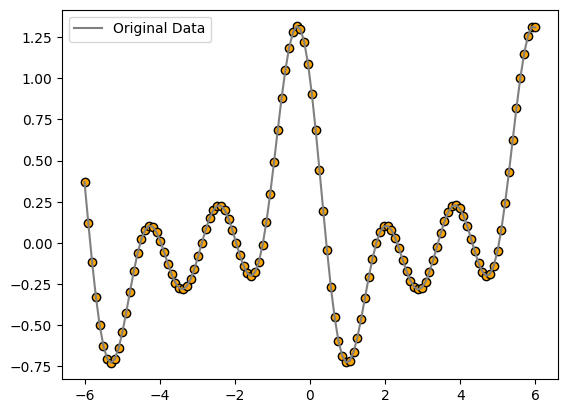

Window End: -4.50, Window Size: 5, R²: 0.812239


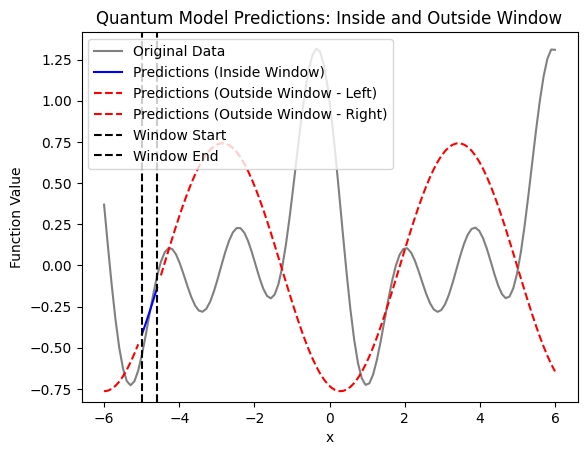

Window End: -4.30, Window Size: 7, R²: 0.975771


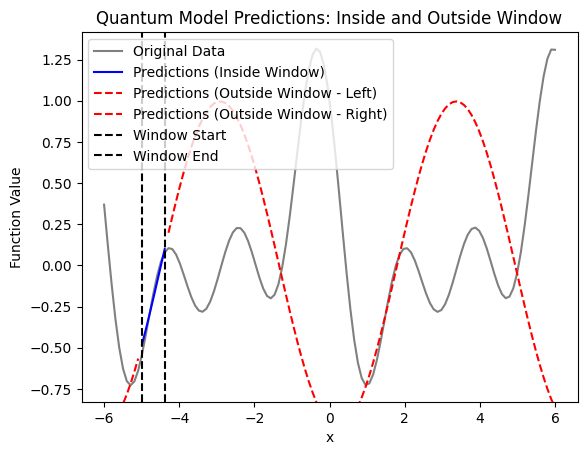

Window End: -4.10, Window Size: 9, R²: 0.921297


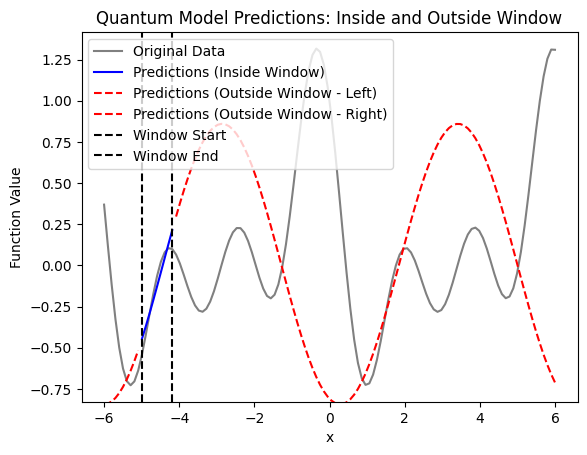

Window End: -3.90, Window Size: 11, R²: 0.818734


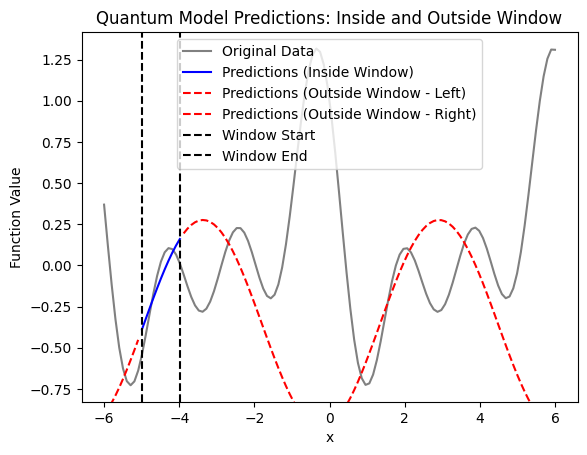

Window End: -3.70, Window Size: 13, R²: 0.601816


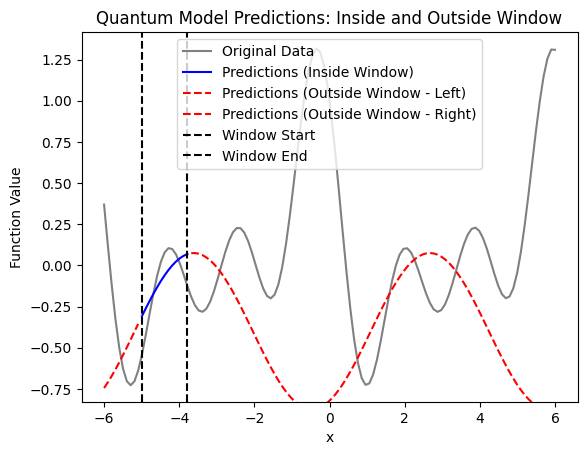

Window End: -3.50, Window Size: 15, R²: 0.225245


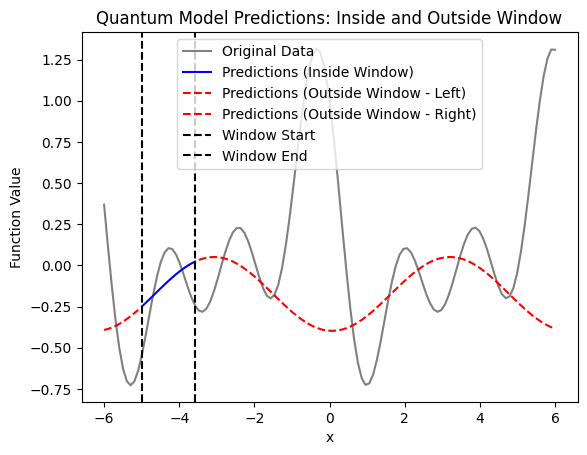

Window End: -3.30, Window Size: 17, R²: 0.412813


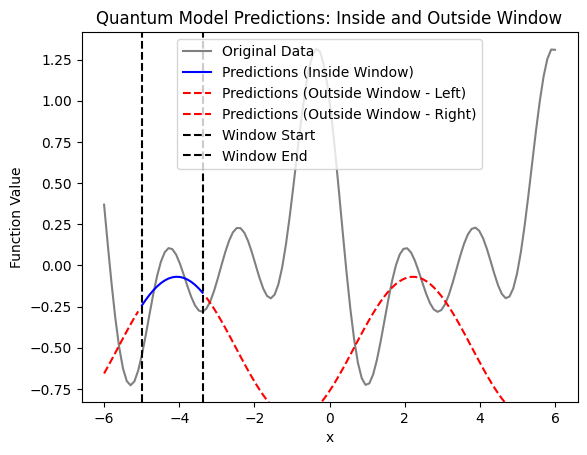

Window End: -3.10, Window Size: 19, R²: 0.413229


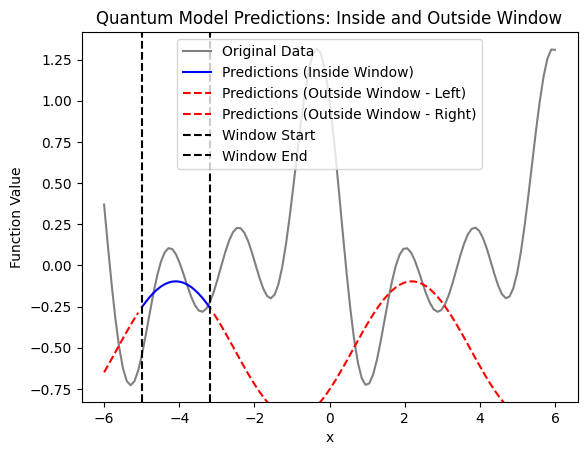

Window End: -2.90, Window Size: 21, R²: 0.329593


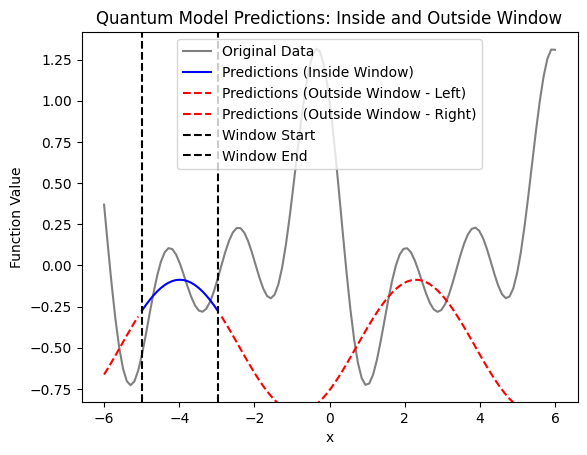

Window End: -2.70, Window Size: 23, R²: 0.120837


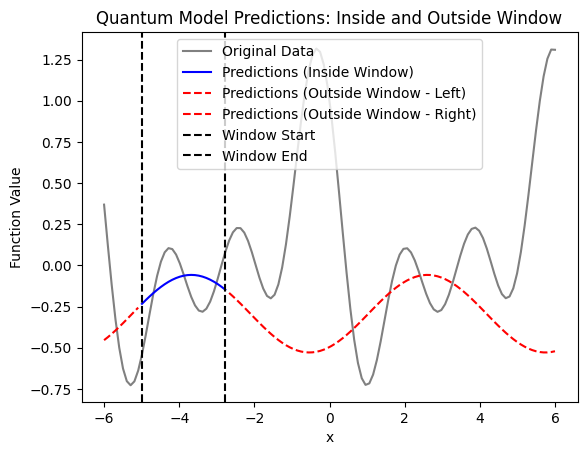

Window End: -2.50, Window Size: 25, R²: 0.083935


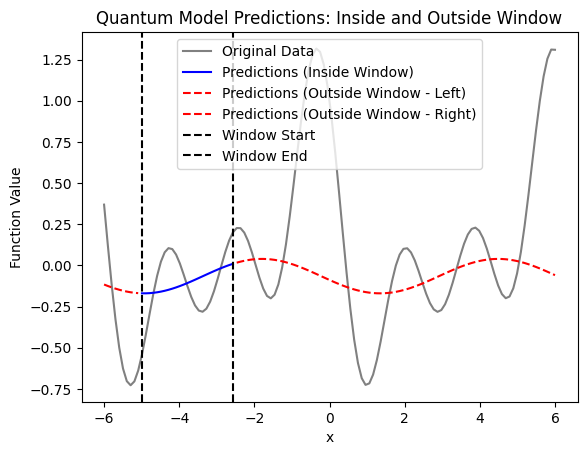

Window End: -2.30, Window Size: 27, R²: 0.173768


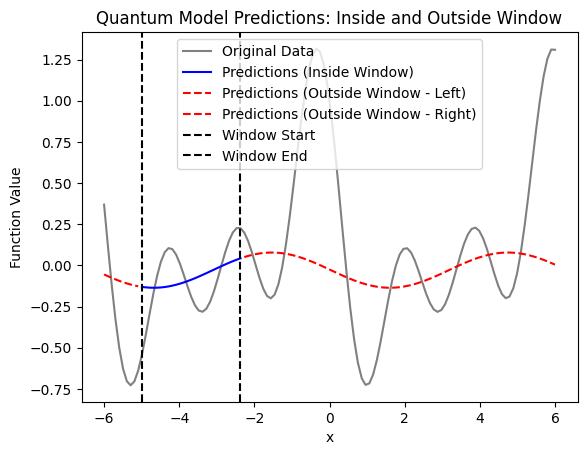

Window End: -2.10, Window Size: 29, R²: 0.237257


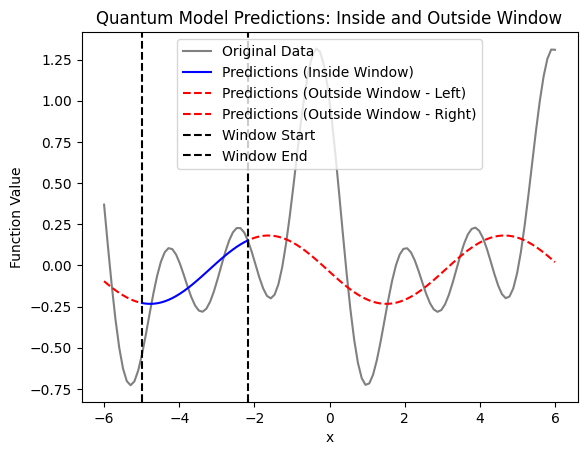

Window End: -1.90, Window Size: 31, R²: 0.202519


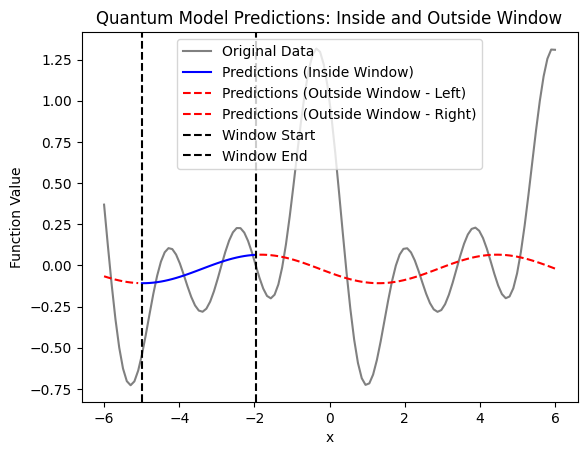

Window End: -1.70, Window Size: 33, R²: 0.169351


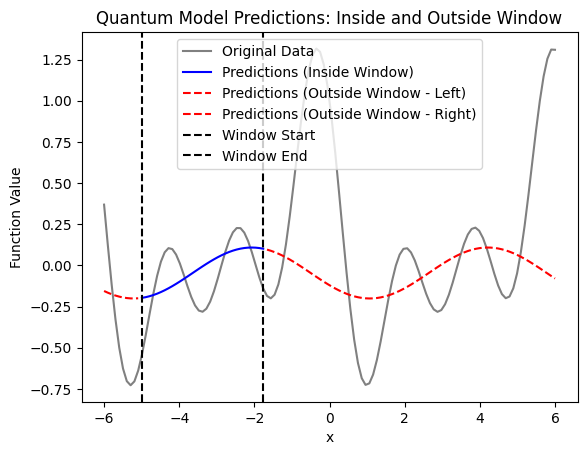

Window End: -1.50, Window Size: 35, R²: 0.136443


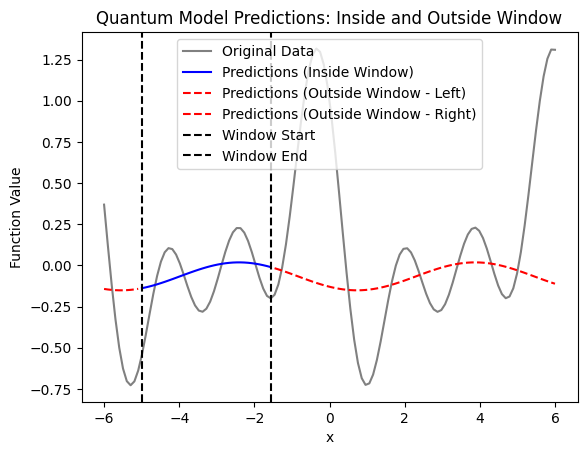

Window End: -1.30, Window Size: 37, R²: 0.111661


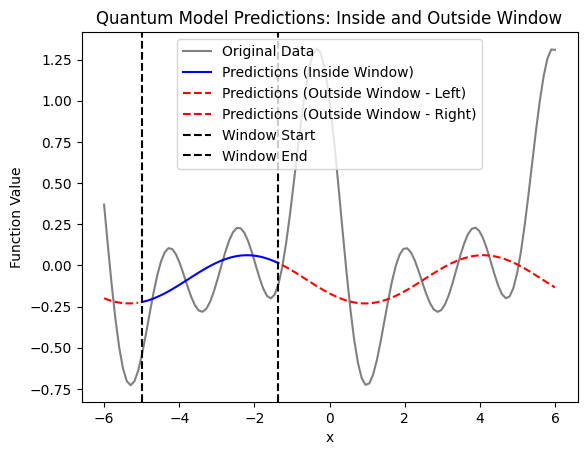

Window End: -1.10, Window Size: 39, R²: 0.158467


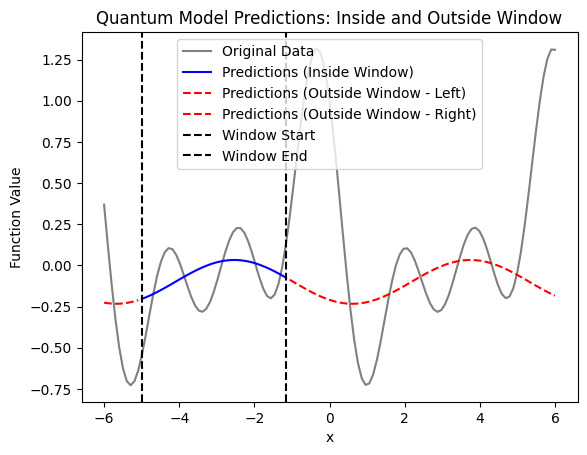

Window End: -0.90, Window Size: 41, R²: -0.049356


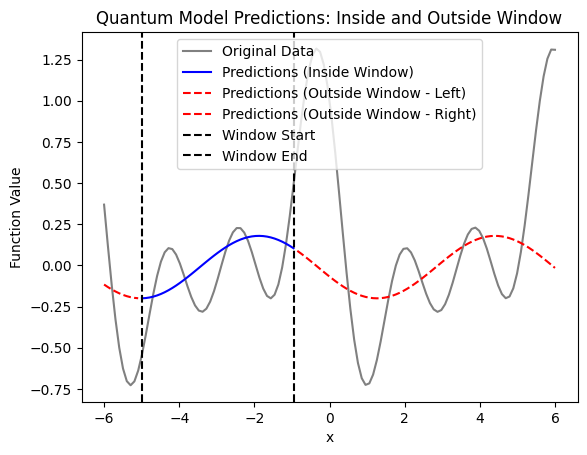

Window End: -0.70, Window Size: 43, R²: 0.203568


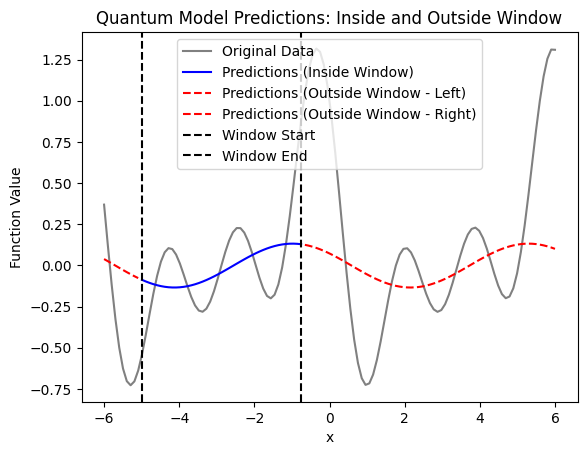

Window End: -0.50, Window Size: 45, R²: 0.302509


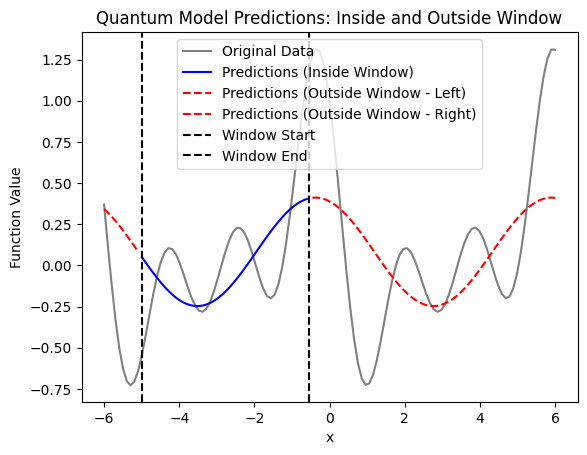

Window End: -0.30, Window Size: 47, R²: 0.389291


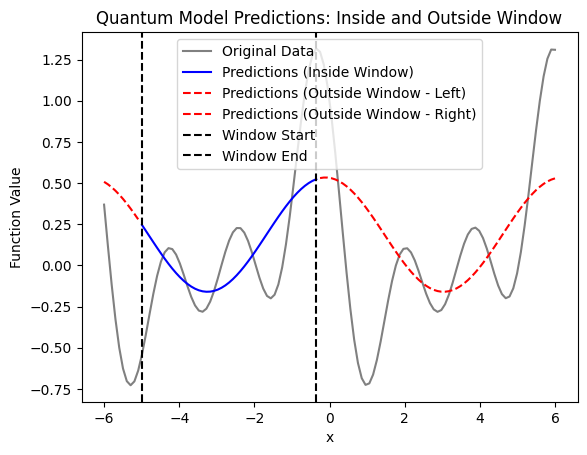

Window End: -0.10, Window Size: 49, R²: 0.438563


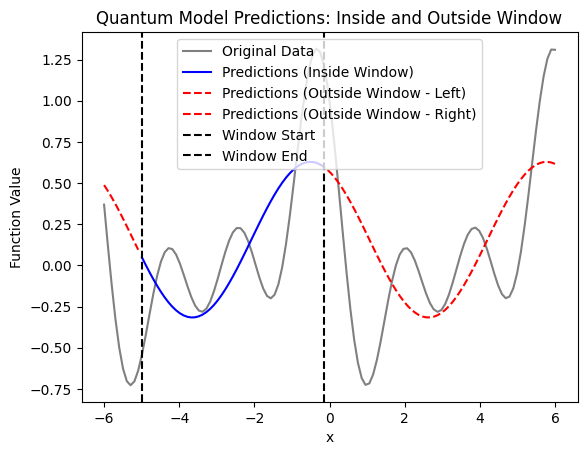

Window End: 0.10, Window Size: 50, R²: 0.491111


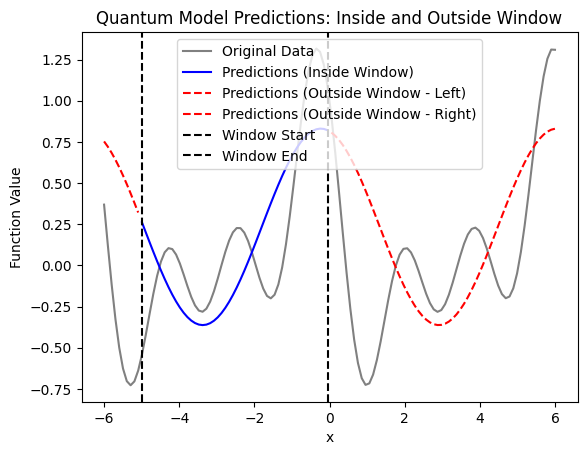

Window End: 0.30, Window Size: 52, R²: 0.489906


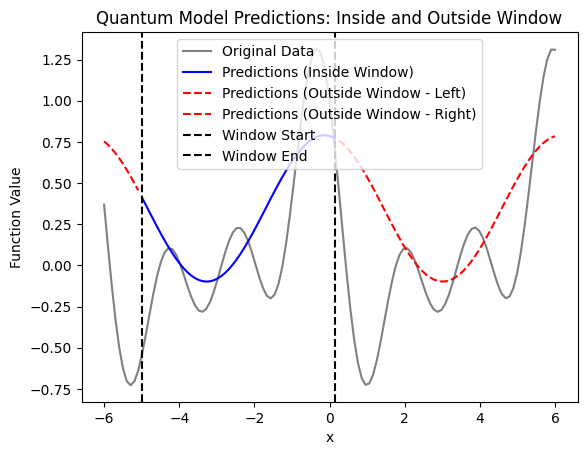

Window End: 0.50, Window Size: 54, R²: 0.515871


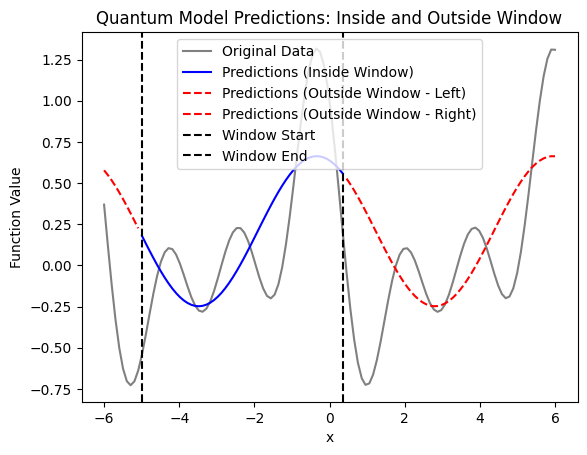

Window End: 0.70, Window Size: 56, R²: 0.429060


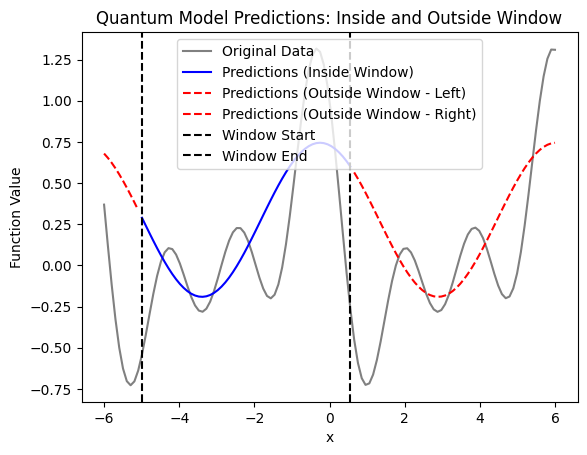

Window End: 0.90, Window Size: 58, R²: 0.345784


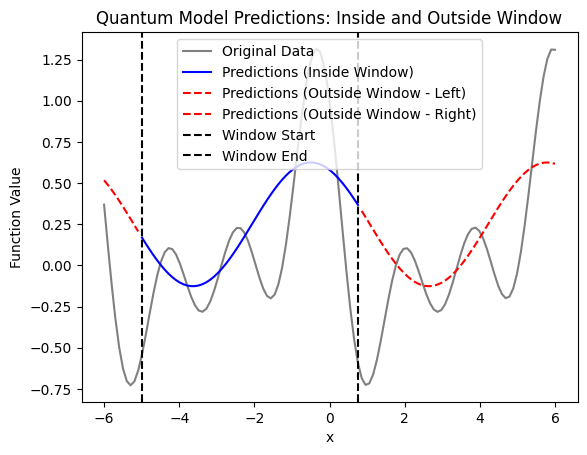

Window End: 1.10, Window Size: 60, R²: 0.329384


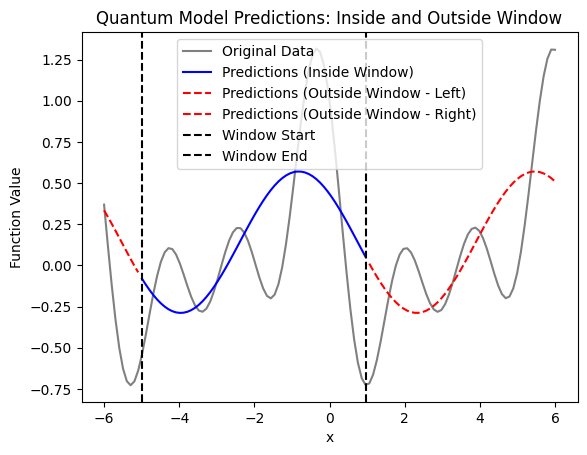

Window End: 1.30, Window Size: 62, R²: 0.301981


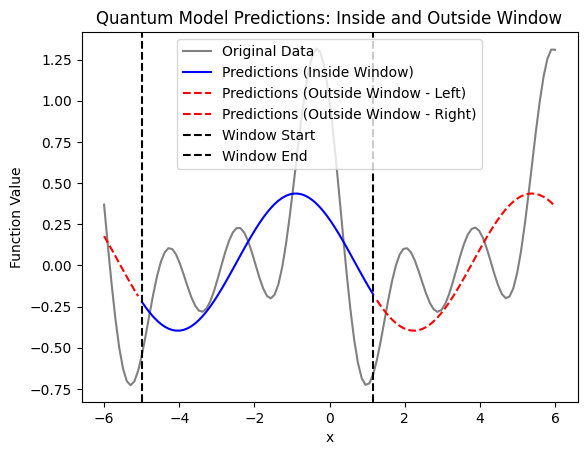

Window End: 1.50, Window Size: 64, R²: 0.290047


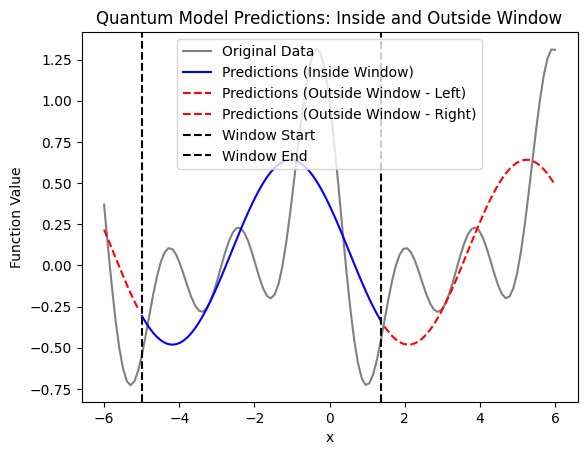

Window End: 1.70, Window Size: 66, R²: 0.328902


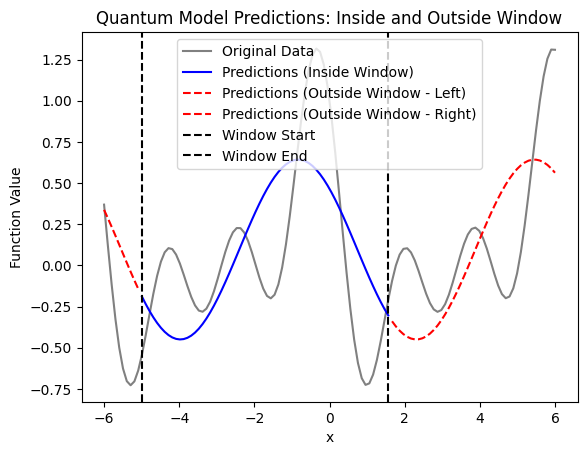

Window End: 1.90, Window Size: 68, R²: 0.308961


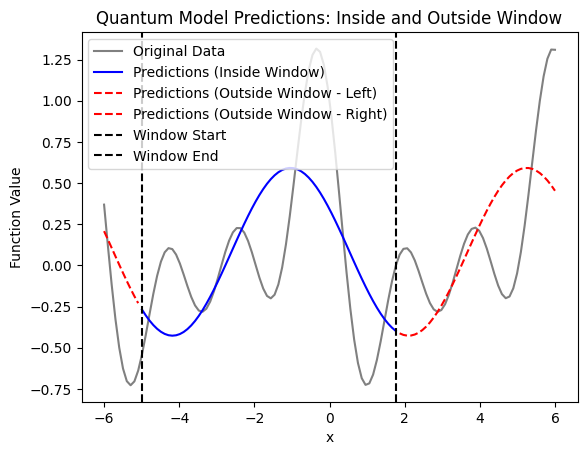

Window End: 2.10, Window Size: 70, R²: 0.291170


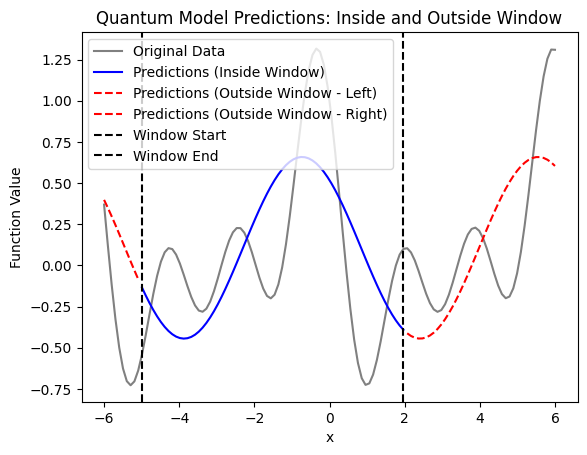

Window End: 2.30, Window Size: 72, R²: 0.280963


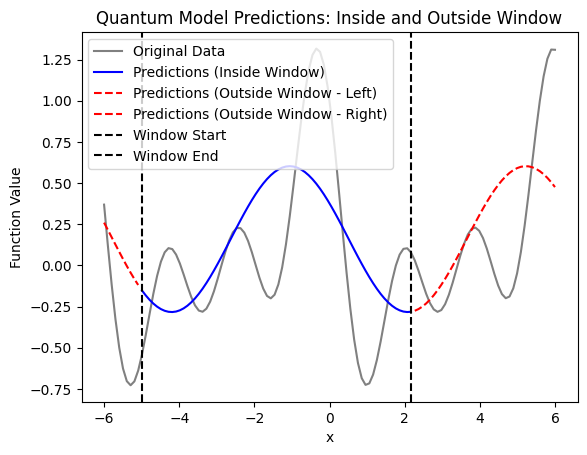

Window End: 2.50, Window Size: 74, R²: 0.184099


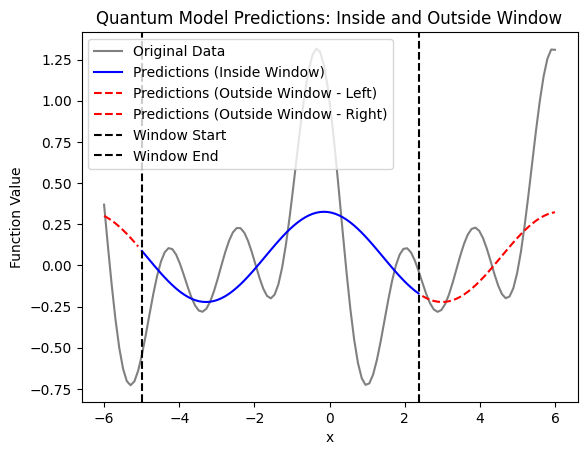

Window End: 2.70, Window Size: 76, R²: 0.286924


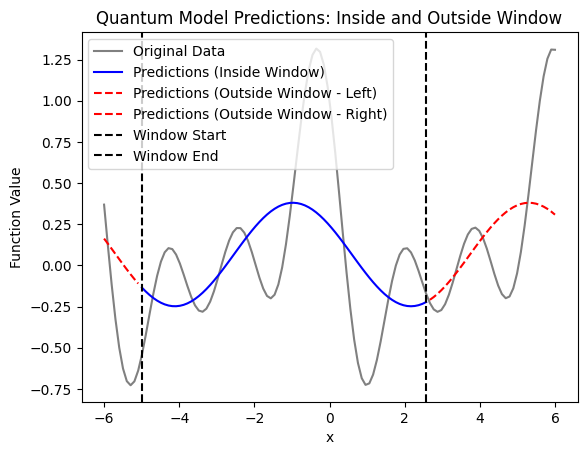

Window End: 2.90, Window Size: 78, R²: 0.305422


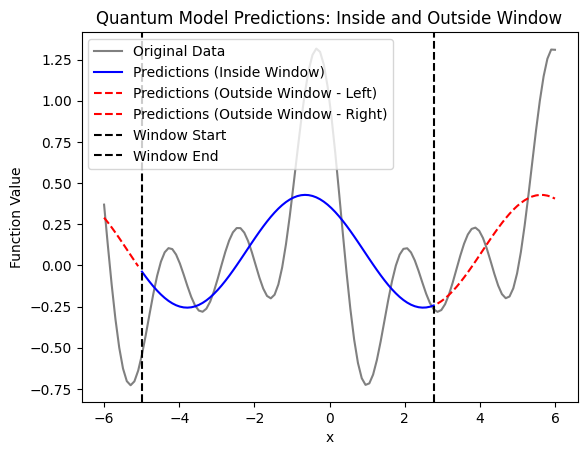

Window End: 3.10, Window Size: 80, R²: 0.312236


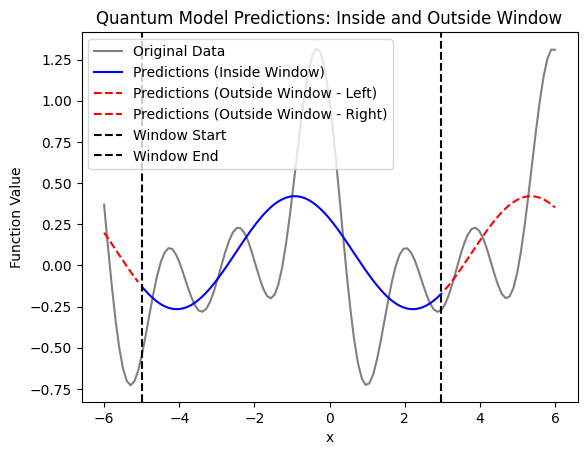

Window End: 3.30, Window Size: 82, R²: 0.218387


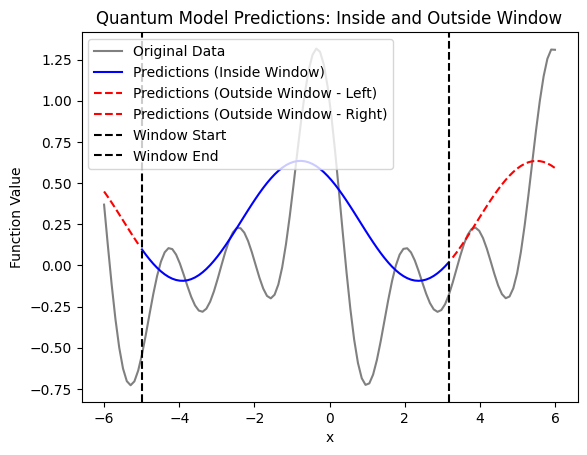

Window End: 3.50, Window Size: 84, R²: 0.313004


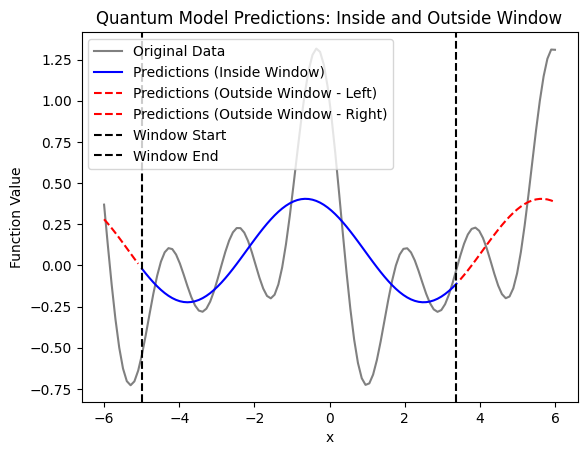

Window End: 3.70, Window Size: 86, R²: 0.256347


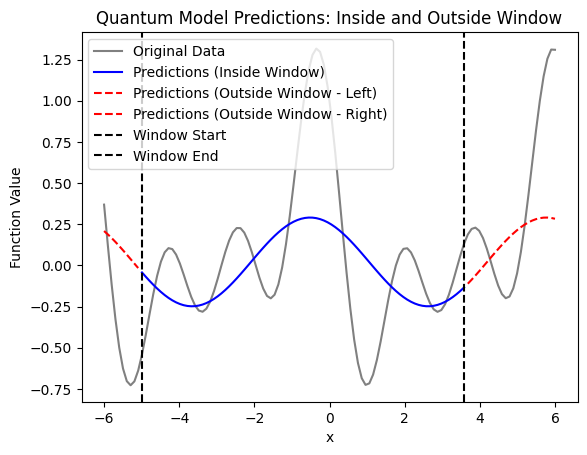

Window End: 3.90, Window Size: 88, R²: 0.294846


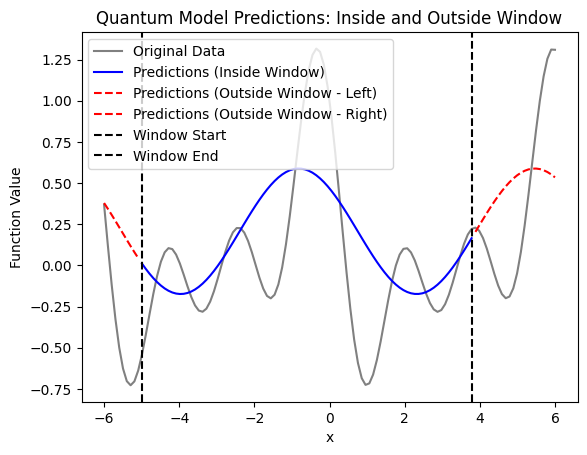

Window End: 4.10, Window Size: 90, R²: 0.283270


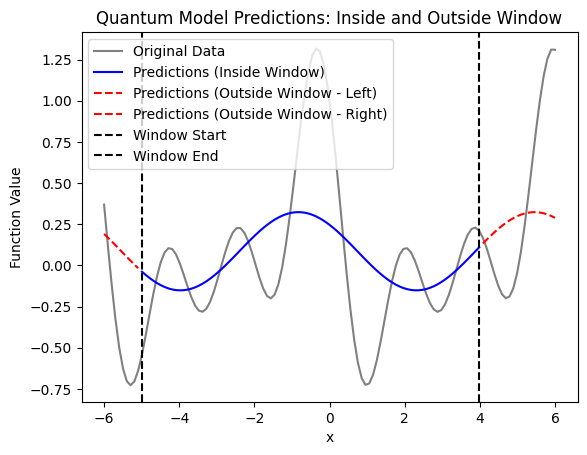

Window End: 4.30, Window Size: 92, R²: 0.270193


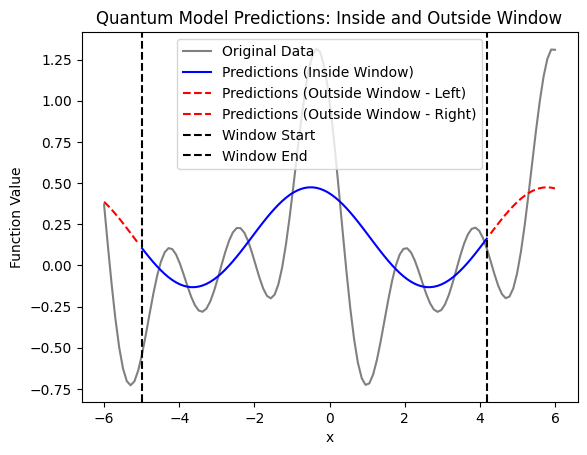

Window End: 4.50, Window Size: 94, R²: 0.094005


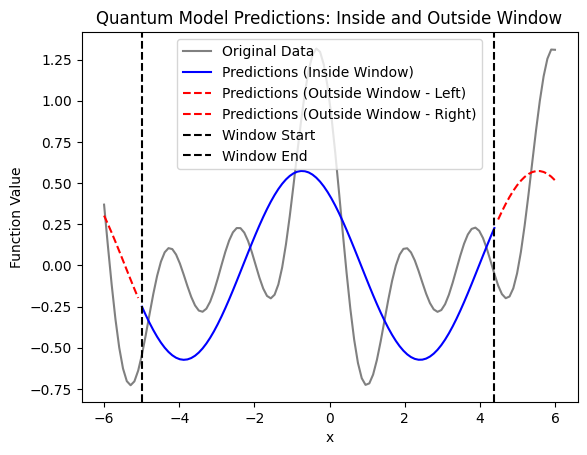

Window End: 4.70, Window Size: 96, R²: 0.247854


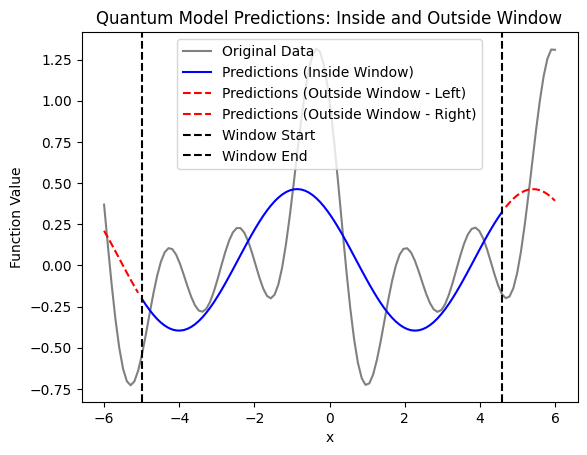

Window End: 4.90, Window Size: 98, R²: 0.190545


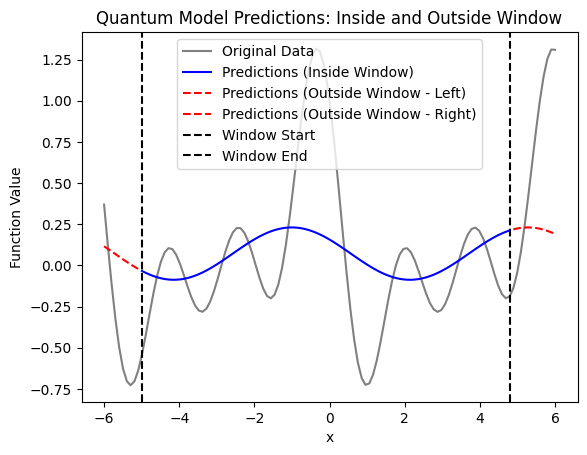

Window End: 5.10, Window Size: 100, R²: 0.221307


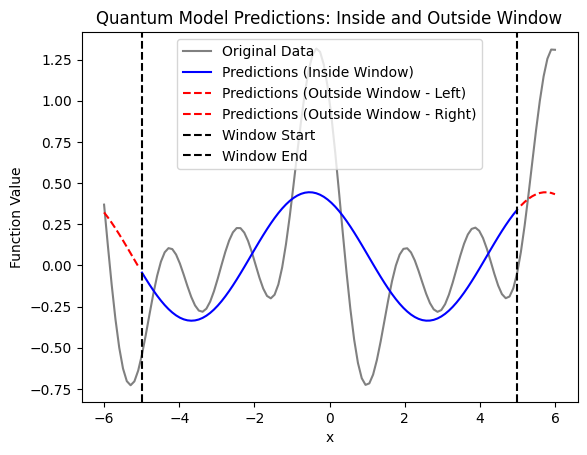

Window End: 5.30, Window Size: 102, R²: 0.200163


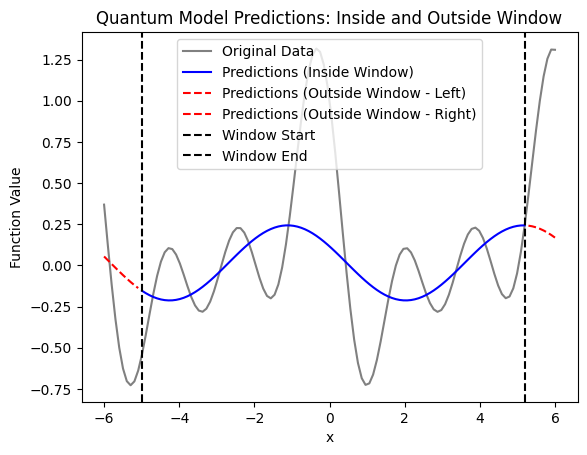

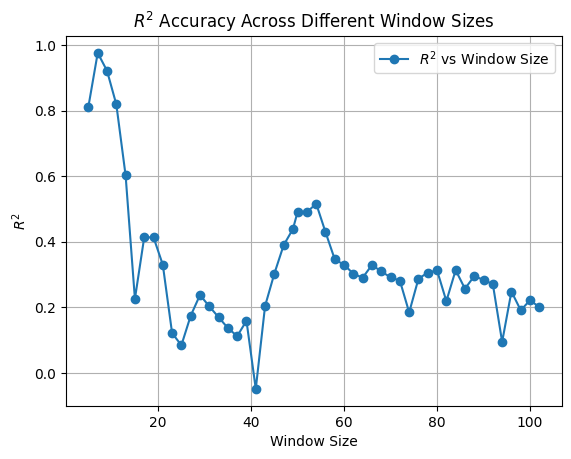

In [ ]:
import matplotlib.pyplot as plt
import pennylane as qml
from pennylane import numpy as np
from pennylane.templates import StronglyEntanglingLayers

np.random.seed(42)

# Set input signal parameters
degree = 3  # degree of the target function
scaling = 1  # scaling of the data
coeffs = [0.15 + 0.15j] * degree  # coefficients of non-zero frequencies
coeff0 = 0.1  # coefficient of zero frequency

sampling_rate = 10  # number of data points per unit interval on the x-axis
(x_axis_left, x_axis_right) = (-6, 6)  # signal's left and right edges

def target_function(x):
    """Generate a truncated Fourier series of degree, where the data gets re-scaled."""
    res = coeff0
    for idx, coeff in enumerate(coeffs):
        exponent = complex(0, scaling * (idx + 1) * x)
        conj_coeff = np.conjugate(coeff)
        res += coeff * np.exp(exponent) + conj_coeff * np.exp(-exponent)
    return np.real(res)

num_data_points = int(sampling_rate * (x_axis_right - x_axis_left))
x = np.linspace(x_axis_left, x_axis_right, num_data_points)
target_y = np.array([target_function(x_) for x_ in x])  # used later for training

# Plot the original target function
plt.plot(x, target_y, c='gray', label='Original Data')
plt.scatter(x, target_y, facecolor='orange', edgecolor='black')
plt.ylim(min(target_y) - 0.1, max(target_y) + 0.1)
plt.legend()
plt.show()

# Rectangular window implementation
def rectangular_window(num_points, start_index, window_size):
    """Create a rectangular window."""
    if window_size > num_points or start_index + window_size > num_points:
        raise ValueError("Window size must fit within the range of data points.")
    window = np.zeros(num_points)
    window[start_index:start_index + window_size] = 1
    return window

################# 1. QUANTUM MODEL DESCRIPTION #################

n_qubits = 2
dev = qml.device('default.qubit', wires=n_qubits)

def square_loss(targets, predictions):
    loss = 0
    for t, p in zip(targets, predictions):
        loss = loss + (t - p) ** 2
    loss = loss / len(targets)
    return 0.5 * loss

def S(x):
    for w in range(n_qubits):
        qml.RX(scaling * x, wires=w)

def W(theta):
    StronglyEntanglingLayers(theta, wires=range(n_qubits))

@qml.qnode(dev)
def quantum_model(weights, x=None):
    W(weights[0])
    S(x)
    W(weights[1])
    return qml.expval(qml.PauliZ(wires=0))

# Initialize weights for the quantum layers
trainable_block_layers = 1  # Set the number of trainable circuit block layers.
weights = 2 * np.pi * np.random.random(size=(2, trainable_block_layers, n_qubits, 3))

################# 2. WINDOW SIZE LOOP #################

# Customizable window parameters
window_start_x = -5  # Fixed window start
window_end_start = -4.5  # Starting window end
window_end_stop = 5.5  # Final window end
window_increment = 0.2  # Increment for window end

# Store results for plotting
window_sizes = []
r2_values = []

for window_end_x in np.arange(window_end_start, window_end_stop, window_increment):
    # Convert x values to indices for the rectangular window
    start_index = np.argmin(np.abs(x - window_start_x))
    end_index = np.argmin(np.abs(x - window_end_x))
    window_size = end_index - start_index
    window = rectangular_window(num_data_points, start_index, window_size)
    windowed_target_y = target_y * window

    # Training configuration
    max_batch_size = 25  # Batch size limit
    max_steps = 60
    opt = qml.AdamOptimizer(0.3)
    batch_size = min(window_size, max_batch_size)

    cst = []
    for step in range(max_steps):
        batch_indices = np.random.choice(range(start_index, start_index + window_size), size=batch_size, replace=False)
        x_batch = x[batch_indices]
        y_batch = windowed_target_y[batch_indices]

        weights = opt.step(lambda w: square_loss(y_batch, [quantum_model(w, x=x_) for x_ in x_batch]), weights)
        c = square_loss(y_batch, [quantum_model(weights, x=x_) for x_ in x_batch])
        cst.append(c)

    # Calculate R² for the patch
    predictions = [quantum_model(weights, x=x_) for x_ in x]
    predictions_patch = predictions[start_index:start_index + window_size]
    target_patch = target_y[start_index:start_index + window_size]

    sst_patch = np.sum((target_patch - np.mean(target_patch)) ** 2)
    sse_patch = np.sum((target_patch - predictions_patch) ** 2)
    r2_patch = 1 - (sse_patch / sst_patch) if sst_patch != 0 else np.nan

    print(f"Window End: {window_end_x:.2f}, Window Size: {window_size}, R²: {r2_patch:.6f}")
    window_sizes.append(window_size)
    r2_values.append(r2_patch)

    ################# 3. PLOTS got each window size loop #################

    # Plot predictions inside and outside the window
    plt.plot(x, target_y, c='gray', label='Original Data')

    # Inside the window
    plt.plot(x[start_index:start_index + window_size],
            predictions[start_index:start_index + window_size],
            c='blue', label='Predictions (Inside Window)')

    # Outside the window (left)
    plt.plot(x[:start_index], predictions[:start_index],
            c='red', linestyle='dashed', label='Predictions (Outside Window - Left)')

    # Outside the window (right)
    plt.plot(x[start_index + window_size:], predictions[start_index + window_size:],
            c='red', linestyle='dashed', label='Predictions (Outside Window - Right)')

    # Styling and legends
    plt.ylim(min(target_y) - 0.1, max(target_y) + 0.1)
    plt.axvline(x[start_index], color='black', linestyle='--', label='Window Start')
    plt.axvline(x[start_index + window_size - 1], color='black', linestyle='--', label='Window End')
    plt.legend()
    plt.title("Quantum Model Predictions: Inside and Outside Window")
    plt.xlabel("x")
    plt.ylabel("Function Value")
    plt.show()


################# 4. PLOTS #################

# Plot R² vs Window Size
plt.plot(window_sizes, r2_values, marker='o', label='$R^2$ vs Window Size')
plt.xlabel("Window Size")
plt.ylabel("$R^2$")
plt.title("$R^2$ Accuracy Across Different Window Sizes")
plt.legend()
plt.grid()
plt.show()


# plot analysis for 3 vs 2 vs 1 qubit

Here we copied results from previous sims to analyse results.

In [ ]:
import plotly.graph_objects as go

# Data for plotting
window_end_1 = [-4.50 + i*0.2 for i in range(52)]
window_size_1 = [5 + i*2 for i in range(52)]
r2_1 = [
    0.924457, 0.970299, 0.927053, 0.820300, 0.629648, 0.472708, 0.427857, 0.442093, 0.365247, 0.116324,
    0.092843, 0.172145, 0.243274, 0.228944, 0.123308, 0.162781, 0.113629, 0.121215, 0.066624, 0.194896,
    0.254676, 0.408292, 0.418037, 0.492087, 0.503735, 0.438857, 0.441691, 0.359785, 0.254963, 0.221682,
    0.335223, 0.344170, 0.302069, 0.279666, 0.200051, 0.182452, 0.283573, 0.309850, 0.303850, 0.270671,
    0.149997, 0.268893, 0.290045, 0.320869, 0.285277, 0.271680, 0.259615, 0.209227, 0.249493, 0.166690
]

window_end_2 = [-4.50 + i*0.2 for i in range(52)]
window_size_2 = [5 + i*2 for i in range(52)]
r2_2 = [
    0.812239, 0.975771, 0.921297, 0.818734, 0.601816, 0.225245, 0.412813, 0.413229, 0.329593, 0.120837,
    0.083935, 0.173768, 0.237257, 0.202519, 0.169351, 0.136443, 0.111661, 0.158467, -0.049356, 0.203568,
    0.302509, 0.389291, 0.438563, 0.491111, 0.489906, 0.515871, 0.429060, 0.345784, 0.329384, 0.301981,
    0.290047, 0.328902, 0.308961, 0.291170, 0.280963, 0.184099, 0.286924, 0.305422, 0.312236, 0.218387,
    0.313004, 0.256347, 0.294846, 0.283270, 0.270193, 0.094005, 0.247854, 0.190545, 0.221307, 0.200163
]

window_end_3 = [-4.50 + i*0.2 for i in range(52)]
window_size_3 = [5 + i*2 for i in range(52)]
r2_3 = [
    0.990216, 0.990594, 0.985994, 0.978711, 0.917929, 0.961960, 0.914291, 0.838980, 0.720636, 0.758140,
    0.723407, 0.794335, 0.694097, 0.541305, 0.511805, 0.252582, 0.431251, 0.248085, 0.099947, 0.284926,
    0.522637, 0.642452, 0.716608, 0.701113, 0.753985, 0.712723, 0.647374, 0.593069, 0.622327, 0.629392,
    0.660370, 0.554488, 0.658972, 0.603939, 0.594396, 0.579468, 0.587752, 0.610252, 0.606171, 0.593875,
    0.592032, 0.409459, 0.451927, 0.519976, 0.555508, 0.550653, 0.553450, 0.481818, 0.510793, 0.430284
]

# Create figure
fig = go.Figure()

fig.add_trace(go.Scatter(x=window_size_1, y=r2_1, mode='lines+markers', name='1 Qubit 1 Layer'))
fig.add_trace(go.Scatter(x=window_size_2, y=r2_2, mode='lines+markers', name='2 Qubit 1 Layer'))
fig.add_trace(go.Scatter(x=window_size_3, y=r2_3, mode='lines+markers', name='3 Qubit 1 Layer'))

# Update layout
fig.update_layout(
    title="R² Score Across Different Window Sizes",
    xaxis_title="Window Size",
    yaxis_title="R² Score",
    template="plotly_white",
    legend_title="Quantum Model"
)

# Show plot
fig.show()
